# 產生復健系統比對資料

(795, 16, 3)
(601, 16, 3)
x: (601, 16)
y: (11, 16)
len(A_h_I): 601
len(A_c_I): 11
now j: 1
previous j: 0
similarity_scores in calculate_segmented_similarity_avg:  [np.float32(0.73022646), np.float32(0.7301794), np.float32(0.72986114), np.float32(0.7296763), np.float32(0.729504), np.float32(0.7292253), np.float32(0.7290431), np.float32(0.7288471), np.float32(0.7286816), np.float32(0.72862834), np.float32(0.7285558), np.float32(0.7285209), np.float32(0.72847867), np.float32(0.7284696), np.float32(0.72846925), np.float32(0.7283675), np.float32(0.7283382), np.float32(0.7283229), np.float32(0.7282672), np.float32(0.72823924), np.float32(0.7281686), np.float32(0.7281572), np.float32(0.72812563), np.float32(0.7271159), np.float32(0.7249142), np.float32(0.72209305), np.float32(0.7184581), np.float32(0.71442676), np.float32(0.71047133), np.float32(0.70790297), np.float32(0.70737696), np.float32(0.70661706), np.float32(0.7056544), np.float32(0.7055552), np.float32(0.7043797), np.float32(0.704238

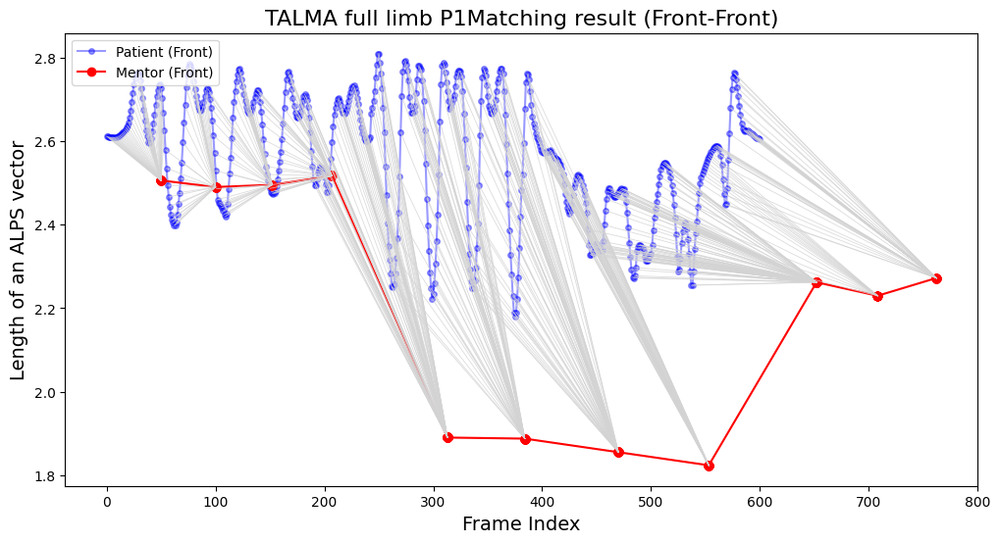

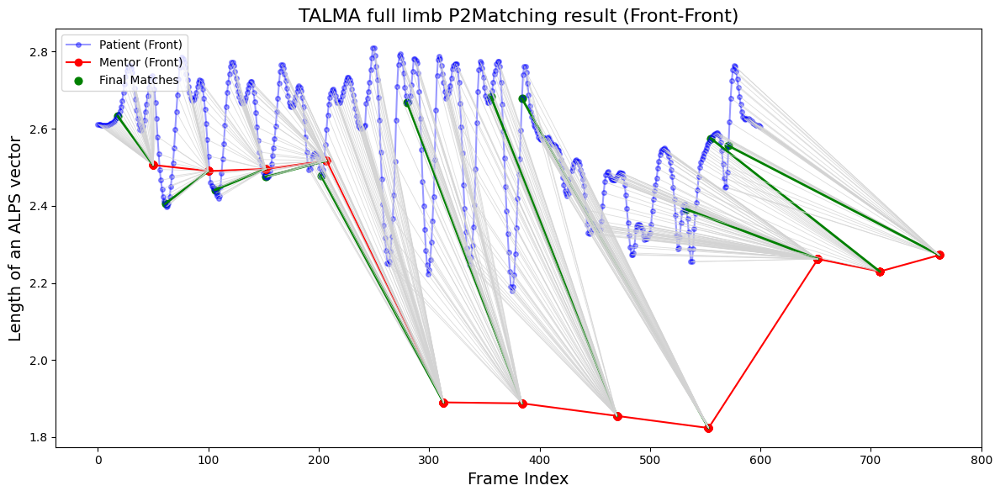

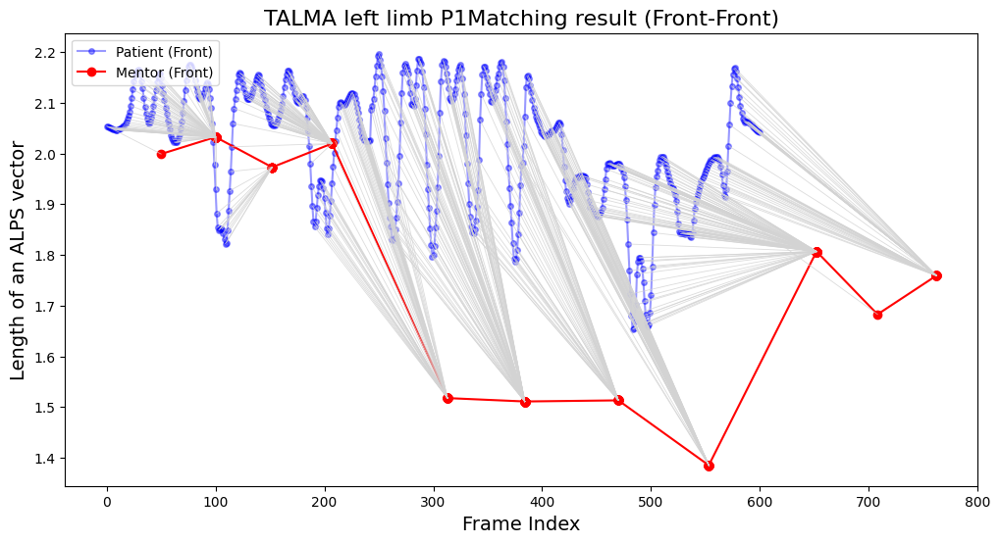

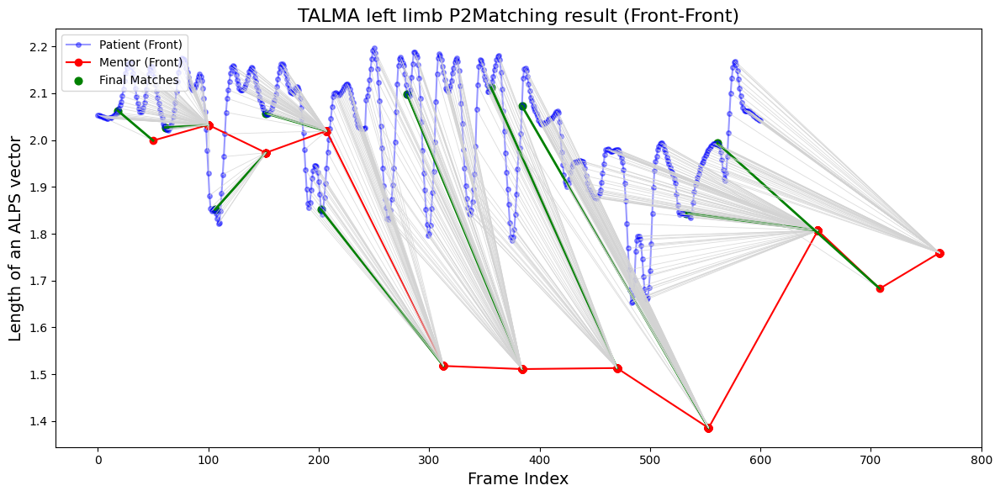

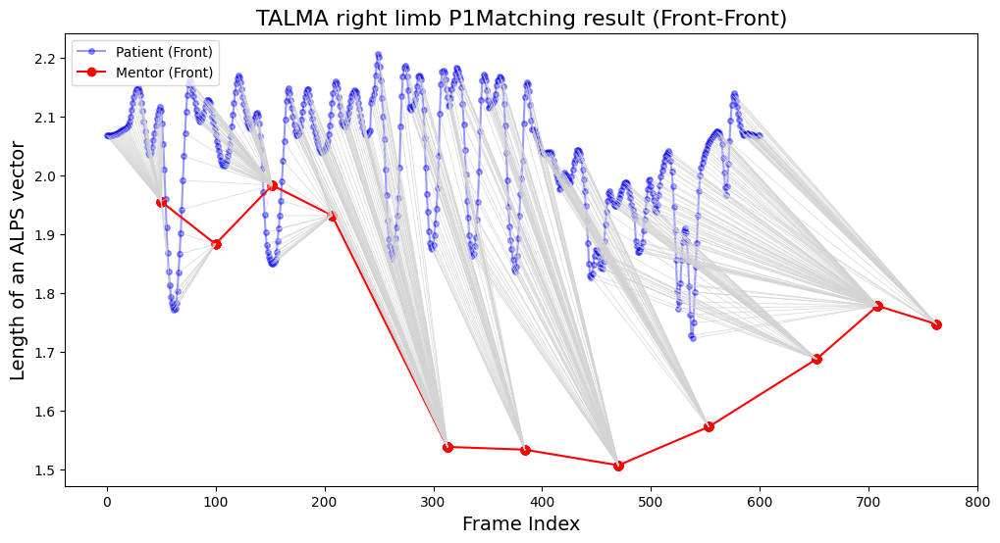

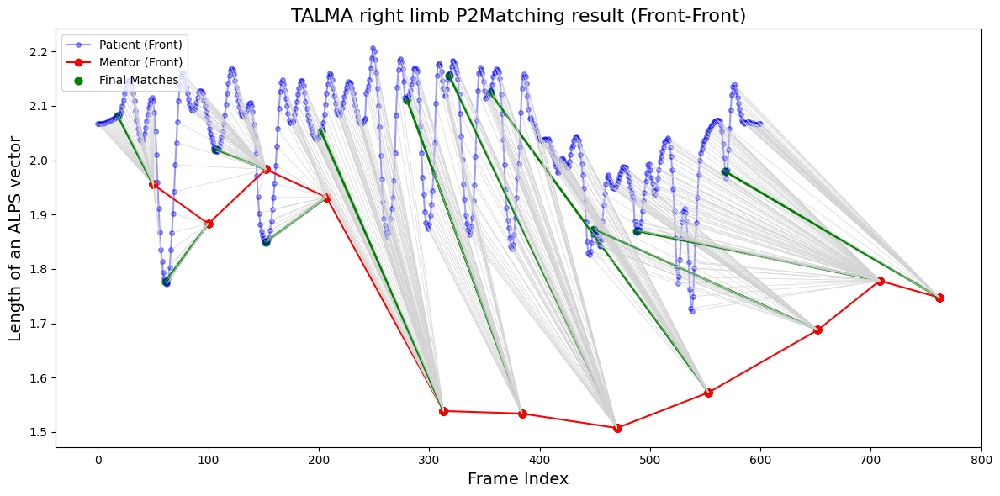

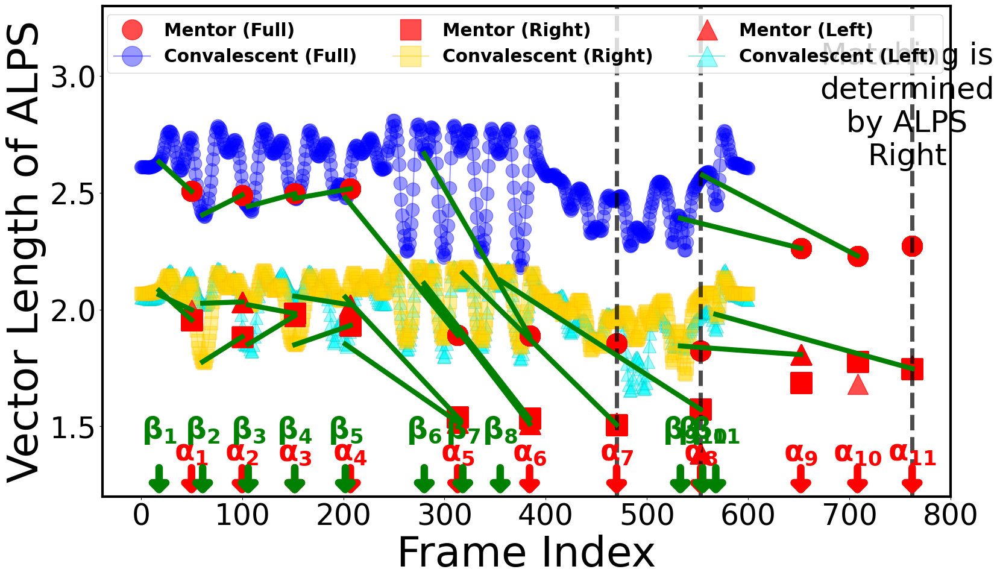

MentorHLT: ['50', '100', '152', '207', '313', '384', '470', '553', '652', '708', '762']


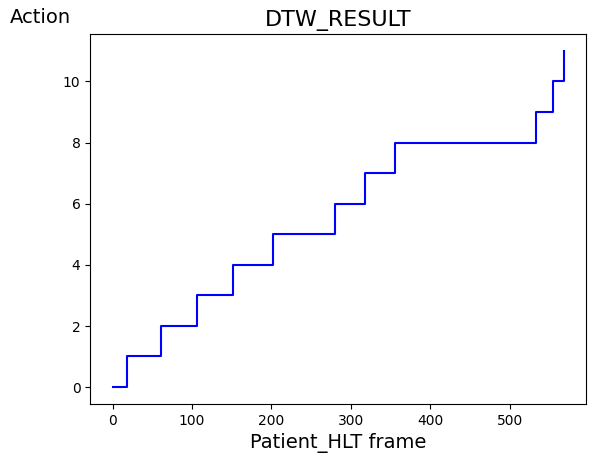

ptre[0]: [18, 61, 106, 152, 202, 280, 318, 355, 533, 555, 568]

len(metor): (795, 17, 3)
len(vid1): (601, 17, 3)
mentor_HightlightFrame: <map object at 0x7f0c305dda50>
vid1_collect_similarity: 601
vid1_agleMatrix: 601



In [ ]:
"""
動作相似度比對主程式。

流程概要：
- 讀取導師/病患的關鍵幀 JSON 與 MotionBERT 3D 骨架 (npy)。
- 建立 16 條肢段向量，計算向量間的餘弦相似度矩陣（全身/左/右）。
- 依導師關鍵幀抽取特徵，後續用於 DTW 及相似度計算。
"""

from matplotlib import pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from sklearn.metrics.pairwise import cosine_similarity
import json
import time
import cv2
from math import sqrt
from collections import Counter
import textwrap
from matplotlib.ticker import FuncFormatter
from matplotlib.legend_handler import HandlerLine2D
import matplotlib.lines as mlines
import os

def main_fun(charactor1, charactor2):
    """對單一導師/病患組合計算骨架特徵與相似度基礎資料。"""
    # start_time = time.time()

    # 數 filter_one_to_one 裡面有幾次是相似度不合格的
    count_underqualified = 0

    # 讀取JSON檔案
    with open(f'json/{charactor1}.json', 'r') as file:
        data = json.load(file)
    # 抓取所有的frameCount值
    mentor_HightlightFrame = [item['frameCount'] for item in data]

    mentorVideo = np.load(f'motionbert_output/{charactor1}.npy')
    patientVideo = np.load(f'motionbert_output/{charactor2}.npy')

    video_title = "PatientAngle"
    if charactor2 == "DPPatient":
        video_title = "Front"
    elif charactor2 == "DPPatientRight":
        video_title = "Right"
    elif charactor2 == "DPPatientLeft":
        video_title = "Left"

    # 計算時間
    # section1_start_time = time.time()


    # 計算關節向量 16：以關節座標組合為肢段向量（順序固定）
    def calculate_joint_vectorsT(video):
        vectors = []
        vectors.append(video[:, 10, :] - video[:, 9, :])#1 (0)
        vectors.append(video[:, 9, :] - video[:, 8, :])#2 (1)
        vectors.append(video[:, 11, :] - video[:, 8, :])#3 (2)
        vectors.append(video[:, 12, :] - video[:, 11, :])#4 (3)
        vectors.append(video[:, 13, :] - video[:, 12, :])#5 (4)
        vectors.append(video[:, 14, :] - video[:, 8, :])#6 (5)
        vectors.append(video[:, 15, :] - video[:, 14, :])#7 (6)
        vectors.append(video[:, 16, :] - video[:, 15, :])#8 (7)
        vectors.append(video[:, 7, :] - video[:, 8, :])#9 (8)
        vectors.append(video[:, 0, :] - video[:, 7, :])#10 (9)
        vectors.append(video[:, 4, :] - video[:, 0, :])#11 (10)
        vectors.append(video[:, 5, :] - video[:, 4, :])#12 (11)
        vectors.append(video[:, 6, :] - video[:, 5, :])#13 (12)
        vectors.append(video[:, 1, :] - video[:, 0, :])#14 (13)
        vectors.append(video[:, 2, :] - video[:, 1, :])#15 (14)
        vectors.append(video[:, 3, :] - video[:, 2, :])#16 (15)

        vectors = np.stack(vectors, axis=1)
        return vectors

    mentorVideo_vectors = calculate_joint_vectorsT(mentorVideo)
    patientVideo_vectors = calculate_joint_vectorsT(patientVideo)#向量

    print(mentorVideo_vectors.shape)
    print(patientVideo_vectors.shape)
    # 向量角度：對每幀 16 條向量計算指定配對的餘弦相似度
    def calculate_angle_matrixT(vectors): # 輸入尺寸：(frames, 16, 3)
        angle_matrix = []
        # indices 對應到 RAL tele-physiotherapy 論文中的 Fig.4(c) 的 Formula 配對點
        indices = [(0, 1), (1, 2), (2, 3), (3, 4), (1, 5),
                (5, 6), (6, 7), (8, 2), (8, 5), (8, 9),
                (9, 10), (10, 11), (11, 12), (9, 13),
                (13, 14), (14, 15)]
        for t in range(len(vectors)): # 588
            similarity_list_for_each_frame = []
            for i, j in indices: # 16
                similarity = cosine_similarity(vectors[t, i, :].reshape(1,-1),
                                                vectors[t, j, :].reshape(1,-1))[0,0] # 兩向量利用cosine計算角度
                similarity_list_for_each_frame.append(similarity)
            angle_matrix.append(similarity_list_for_each_frame) # {588, 16}
        angle_matrix = np.stack(angle_matrix) # 轉成 numpy {588, 16}
        return angle_matrix

    mentorVideo_vectors_AngleMatrixT = calculate_angle_matrixT(mentorVideo_vectors)
    patientVideo_vectors_AngleMatrixT = calculate_angle_matrixT(patientVideo_vectors)#向量角度結果


    frame_counts_array = np.array(mentor_HightlightFrame, dtype=int)
    # 使用 frame_counts 來對應 tensor 中的位置
    mentor_selected_frames = mentorVideo_vectors_AngleMatrixT[frame_counts_array]

    # video1_selected_frames = video1[frame_counts_array]
    # 輸出結果
    # print("selected_frames:",video1_selected_frames)
    # print(video1_selected_frames.shape)
    # print(type(video1_selected_frames))



    mentor_SelectedFrames = mentor_selected_frames.reshape(-1,16)
    patient_AllFrame = patientVideo_vectors_AngleMatrixT.reshape(-1,16)
    # print(video1_selected_frames.shape)
    # print(vectors2_hlt_frame.shape)
    # print(video1_selected_frames.shape)
    # print(type(video1_selected_frames))
    # print(vectors2_hlt_frame.shape)
    # print(type(vectors2_hlt_frame))


    # def find_similar_positions(arrayA, arrayB):
    #     num_rows_A = arrayA.shape[0] # 11
    #     num_rows_B = arrayB.shape[0] # 601
    #     interval = num_rows_B // num_rows_A  # 計算arrayB中每個區間的大小
    #     similar_positions = []
    #     similarity_scores = []
    #     start_idx_B = 0
    #     for i in range(num_rows_A):
    #         row_A = arrayA[i:i+1, :]
    #         start_idx_B_range = start_idx_B
    #         end_idx_B_range = min(start_idx_B_range + (interval+(int(interval/2))), num_rows_B)
    #         row_B_subset = arrayB[start_idx_B_range:end_idx_B_range, :]
    #         similarities = cosine_similarity(row_A, row_B_subset)
    #         max_similarity_idx = np.argmax(similarities)
    #         max_similarity_score = similarities[0, max_similarity_idx]
    #         similar_positions.append(start_idx_B_range + max_similarity_idx)
    #         similarity_scores.append(max_similarity_score)
    #         start_idx_B += max_similarity_idx + 11  #加多少可調整
    #     return similar_positions, similarity_scores, similarities

    # import pandas as pd

    # patient_HLTposition, HLTscore, similarity_similar_position = find_similar_positions(mentor_SelectedFrames, patient_AllFrame)
    # print("HLTscore from find_similar_positions: ", HLTscore)
    # similarity_array_df = pd.DataFrame(similarity_similar_position)
    # similarity_array_df.to_csv("similarity_array1111.csv", index=False)



    # 利用patient_HLTposition得出HLT位置與AllFrame來做切割，將HLT切割出來，取的剩下的frame為TRS
    # def patient_split_vectors_by_positions(vectors, positions):
    #     vectors = np.array(vectors)
    #     sliced_arrays = []
    #     start_idx = 0
    #     for end_idx in positions:
    #         end_idx=end_idx-1
    #         sliced_array = vectors[start_idx:end_idx, :]
    #         sliced_arrays.append(sliced_array)
    #         start_idx = end_idx
    #         start_idx = start_idx+2
    #     last_sliced_array = vectors[start_idx:, :]
    #     sliced_arrays.append(last_sliced_array)
    #     return sliced_arrays

    # patient_sliced_arrays = patient_split_vectors_by_positions(patient_AllFrame, patient_HLTposition)
    # patient_sliced_arrays = np.array(patient_sliced_arrays, dtype=object)



    # mentor跟patient一樣
    # 利用patient_HLTposition得出HLT位置與AllFrame來做切割，將HLT切割出來，取的剩下的frame為TRS
    # def mentor_split_vectors_by_positions(vectors, positions):
    #     vectors = np.array(vectors)
    #     sliced_arrays = []
    #     start_idx = 0
    #     for end_idx in positions:
    #         end_idx=end_idx-1
    #         sliced_array = vectors[start_idx:end_idx, :]
    #         sliced_arrays.append(sliced_array)
    #         start_idx = end_idx
    #         start_idx = start_idx+2
    #     last_sliced_array = vectors[start_idx:, :]
    #     sliced_arrays.append(last_sliced_array)
    #     return sliced_arrays

    # mentor_Hightlightframe = [int(pos) for pos in mentor_HightlightFrame]
    # mentor_sliced_arrays = mentor_split_vectors_by_positions(mentorVideo_vectors_AngleMatrixT, mentor_Hightlightframe)
    # mentor_sliced_arrays = np.array(mentor_sliced_arrays , dtype=object)


    '''
    Tentative=0.7
    HLT_new_scores = [score * Tentative / len(HLTscore) if score > 0
                    else score * 1 / len(HLTscore) for score in  HLTscore]
    HLT_total_score = sum(HLT_new_scores)
    HLT_total_score=round(HLT_total_score,2)

    TRS_new_scores = [score1 * (1-Tentative) / len(HLTscore) for score1 in  TRS_normalized_distances]
    TRS_total_score = sum(score for score in TRS_new_scores if score > 0)
    TRS_total_score=round(TRS_total_score,2)

    # 印出新的分數列表
    # print(TRS_total_score)

    def final_total_score(score1,score2):
        final_total_score=score1+score2
        #print("final",final_total_score)
        return final_total_score
    final_total_score(HLT_total_score,TRS_total_score)
    final_total_score=round(HLT_total_score+TRS_total_score,2)
    # print(final_total_score)
    '''

    # 計算關節向量 16
    def calculate_joint_vectors(video):
        vectors = []
        vectors.append(video[:, 10, :] - video[:, 9, :])#1 (0)
        vectors.append(video[:, 9, :] - video[:, 8, :])#2 (1)
        vectors.append(video[:, 11, :] - video[:, 8, :])#3 (2)
        vectors.append(video[:, 12, :] - video[:, 11, :])#4 (3)
        vectors.append(video[:, 13, :] - video[:, 12, :])#5 (4)
        vectors.append(video[:, 14, :] - video[:, 8, :])#6 (5)
        vectors.append(video[:, 15, :] - video[:, 14, :])#7 (6)
        vectors.append(video[:, 16, :] - video[:, 15, :])#8 (7)
        vectors.append(video[:, 7, :] - video[:, 8, :])#9 (8)
        vectors.append(video[:, 0, :] - video[:, 7, :])#10 (9)
        vectors.append(video[:, 4, :] - video[:, 0, :])#11 (10)
        vectors.append(video[:, 5, :] - video[:, 4, :])#12 (11)
        vectors.append(video[:, 6, :] - video[:, 5, :])#13 (12)
        vectors.append(video[:, 1, :] - video[:, 0, :])#14 (13)
        vectors.append(video[:, 2, :] - video[:, 1, :])#15 (14)
        vectors.append(video[:, 3, :] - video[:, 2, :])#16 (15)

        vectors = np.stack(vectors, axis=1)
        return vectors

    mentorVideo_vectors = calculate_joint_vectors(mentorVideo)
    patientVideo_vectors = calculate_joint_vectors(patientVideo)#向量

    # section1_end_time = time.time()
    # section1_execution_time = section1_end_time - section1_start_time
    # print(f"keypont to limb: {section1_execution_time} 秒")
    # print(vectors)
    # print(type(vectors))
    # print(vectors.shape)


    # 向量角度
    def calculate_angle_matrix(vectors):
        all_angle_matrix = []
        left_angle_matrix = []
        right_angle_matrix = []
        # 全身
        indices = [(0, 1),
                (1, 2),
                (2, 3),
                (3, 4),
                (1, 5),
                (5, 6),
                (6, 7),
                (8, 2),
                (8, 5),
                (8, 9),
                (9, 10),
                (10, 11),
                (11, 12),
                (9, 13),
                (13, 14),
                (14, 15)]
        
        # 左邊(為醫學上鏡像的左)
        indices_left = [(0, 1),
                (1, 5),
                (5, 6),
                (6, 7),
                (8, 5),
                (8, 9),
                (9, 13),
                (13, 14),
                (14, 15)]
        
        # 右邊(為醫學上鏡像的右)
        indices_right = [(0, 1),
                (1, 2),
                (2, 3),
                (3, 4),
                (8, 2),
                (8, 9),
                (9, 10),
                (10, 11),
                (11, 12)]

        for t in range(len(vectors)): # 588
            similarity_list_for_each_frame = []
            for i, j in indices: # 16
                similarity = cosine_similarity(vectors[t, i, :].reshape(1,-1),
                                                vectors[t, j, :].reshape(1,-1))[0,0] # 兩向量利用cosine計算角度
                similarity_list_for_each_frame.append(similarity)
            all_angle_matrix.append(similarity_list_for_each_frame) # {588, 16}
        all_angle_matrix = np.stack(all_angle_matrix) # 轉成 numpy {588, 16}

        for t in range(len(vectors)): # 588
            similarity_list_for_each_frame = []
            for i, j in indices_left: # 9
                similarity = cosine_similarity(vectors[t, i, :].reshape(1,-1),
                                                vectors[t, j, :].reshape(1,-1))[0,0] # 兩向量利用cosine計算角度
                similarity_list_for_each_frame.append(similarity)
            left_angle_matrix.append(similarity_list_for_each_frame) # {588, 16}
        left_angle_matrix = np.stack(left_angle_matrix) # 轉成 numpy {588, 16}

        for t in range(len(vectors)): # 588
            similarity_list_for_each_frame = []
            for i, j in indices_right: # 9
                similarity = cosine_similarity(vectors[t, i, :].reshape(1,-1),
                                                vectors[t, j, :].reshape(1,-1))[0,0] # 兩向量利用cosine計算角度
                similarity_list_for_each_frame.append(similarity)
            right_angle_matrix.append(similarity_list_for_each_frame) # {588, 16}
        right_angle_matrix = np.stack(right_angle_matrix) # 轉成 numpy {588, 16}

        return all_angle_matrix, left_angle_matrix, right_angle_matrix

    mentorVideo_vectors_AngleMatrix, mentorVideo_vectors_AngleMatrix_left, mentorVideo_vectors_AngleMatrix_right = calculate_angle_matrix(mentorVideo_vectors)
    patientVideo_vectors_AngleMatrix, patientVideo_vectors_AngleMatrix_left, patientVideo_vectors_AngleMatrix_right = calculate_angle_matrix(patientVideo_vectors)#向量角度結果


    frame_counts_array = np.array(mentor_HightlightFrame, dtype=int)
    # 計算每一個動作之間佔了總影片多長的比例
    mentorVideo_length = len(mentorVideo_vectors_AngleMatrix)
    # Calculate the proportion of each action in the total video length
    proportions = []
    # Add a starting point (frame 0) for calculations
    frame_counts_with_start = np.insert(frame_counts_array, 0, 0) # 插入 0 到 frame_counts_arraay 的第 0 個值（不會改變到原本的 frame_counts_array）
    # Calculate proportions
    for i in range(len(frame_counts_array)):
        proportion = (frame_counts_array[i] - frame_counts_with_start[i]) / mentorVideo_length
        proportions.append(proportion)

    # Mentor
    # ===========================================================================================全身
    # 使用 frame_counts 來對應 tensor 中的位置
    mentor_selected_frames = mentorVideo_vectors_AngleMatrix[frame_counts_array]
    # print("mentor_selected_frames:",mentor_selected_frames.shape)
    mentor_SelectedFrames = mentor_selected_frames.reshape(-1,16)
    # mentor_SelectedFrames = mentorVideo_vectors_AngleMatrix.reshape(-1,16) # 採用的是完整的 mentor 影片，不是只取 HLT 點


    # mentor_All_frames = mentorVideo_vectors_AngleMatrix
    # mentor_All_frames = mentor_All_frames.reshape(-1,16)
    # ===========================================================================================左邊
    # 使用 frame_counts 來對應 tensor 中的位置
    mentor_selected_frames_left = mentorVideo_vectors_AngleMatrix_left[frame_counts_array]
    # print(mentor_selected_frames_left.shape)
    # print("mentor_selected_frames:",mentor_selected_frames.shape)
    mentor_SelectedFrames_left  = mentor_selected_frames_left.reshape(-1,9)
    # print("mentor_SelectedFrames_left:",mentor_SelectedFrames_left .shape)
    # mentor_SelectedFrames_left = mentorVideo_vectors_AngleMatrix_left.reshape(-1,9) # 採用的是完整的 mentor 影片，不是只取 HLT 點

    # ===========================================================================================右邊
    # 使用 frame_counts 來對應 tensor 中的位置
    mentor_selected_frames_right = mentorVideo_vectors_AngleMatrix_right[frame_counts_array]
    # print(mentor_selected_frames_right.shape)
    # print("mentor_selected_frames:",mentor_selected_frames.shape)
    mentor_SelectedFrames_right = mentor_selected_frames_right.reshape(-1,9)
    # print("mentor_SelectedFrames_right:",mentor_SelectedFrames_right.shape)
    # mentor_SelectedFrames_right = mentorVideo_vectors_AngleMatrix_right.reshape(-1,9) # 採用的是完整的 mentor 影片，不是只取 HLT 點



    # Patient
    # ======================================全身=====================================================
    patient_AllFrame = patientVideo_vectors_AngleMatrix.reshape(-1,16)

    # ======================================左邊=====================================================
    patient_AllFrame_left = patientVideo_vectors_AngleMatrix_left.reshape(-1,9)

    # ======================================右邊=====================================================
    patient_AllFrame_right = patientVideo_vectors_AngleMatrix_right.reshape(-1,9)

    # ======================================反向=====================================================
    # patient_AllFrame_reversed = np.flipud(patient_AllFrame)


    # def DTW(A_h_I, A_c_I):
    #     # Assume a_h and a_c elements are in the input parameters A_h and A_c, respectively, i.e.,
    #     # A_h_I = {A_h_i, ...} and A_c_I = {A_c_i, ...} // Each element means different frame
    #     # A_h_i = {a_1_h, ..., a_16_h} and A_c_i = {a_1_c, ..., a_16_c}; // Each element in A_h and A_c is the angle of two connected limb pairs with their cosine value.

    #     # Eech element means the cossine similarity between each frame of h and c
    #     Z = [[float('inf')] * (len(A_c_I) + 1) for _ in range(len(A_h_I) + 1)]
    #     Z[0][0] = 0 # 這個位置需要設 0
    #     # print("Z",Z)

    #     # 對於每一個 i, j 計算他們之間的相似度（相似度 based 的距離矩陣: distance(X_i,Y_j)
    #     for i in range(1, len(A_h_I)+1):
    #         for j in range(1, len(A_c_I)+1):
    #                 Z[i][j] = 1 - cosine_similarity(A_h_I[i-1], A_c_I[j-1]) # [0,2] -> 0 代表相似度最高
    #     # print("距離矩陣 (相似度 based):")
    #     # for row in Z:
    #         # print(row)

    #     # 計算累積距離矩陣: D(i,j) = distance(X_i,Y_j) + min(D(i−1,j),D(i,j−1),D(i−1,j−1))
    #     for i in range(1, len(A_h_I)+1):
    #         for j in range(1, len(A_c_I)+1):
    #             Z[i][j] += min(Z[i-1][j-1], Z[i-1][j], Z[i][j-1]) # 這就是將 distance[X_i, Y_j] + min(D(i−1,j),D(i,j−1),D(i−1,j−1))
    #             # print("min(Z[i-1][j-1], Z[i-1][j], Z[i][j-1]):",  min(Z[i-1][j-1], Z[i-1][j], Z[i][j-1]))
    #     print("計算完成的累積距離矩陣:")
    #     D = [row[1:] for row in Z[1:]] # 移除第一行和第一列
    #     # for row in D:
    #         # print(row)

    #     # Traceback：從最右下角回朔，當初怎麼走到最右下角的就是最短路線
    #     i = len(A_h_I)-1
    #     j = len(A_c_I)-1
    #     p, q = [i], [j] # 第一步一定是最右下角，儲存的是最短路徑的索引值
    #     while (i > 0) or (j > 0):
    #         tb = argmin((D[i-1][j-1], D[i][j-1], D[i-1][j])) # 比較大小的順序：對角線 -> 上方 -> 左方
    #         # print(f"D[i-1][j-1]: " + str(D[i-1][j-1]) + "D[i][j-1]: " +  str(D[i][j-1]) + "D[i-1][j]):" + str(D[i-1][j]))
    #         if tb == 0: # 如果最小的值是左上
    #             i -= 1
    #             j -= 1
    #         elif tb == 1: # 如果最小的值是上方
    #             j -= 1
    #         else:  # (tb == 2): # 如果最小的值是左方
    #             i -= 1
    #         p.insert(0, i)
    #         q.insert(0, j)
    #     return D, (p, q)


    def DTW_np(A_h_I, A_c_I):
        # Convert input lists to numpy arrays for efficient computation
        A_h_I = np.array(A_h_I) # (601, 16)
        A_c_I = np.array(A_c_I) # (11, 16)
        print("len(A_h_I):", len(A_h_I)) # 601
        print("len(A_c_I):", len(A_c_I)) # 11
        Z = np.full((len(A_h_I) + 1, len(A_c_I) + 1), np.inf)
        Z[0, 0] = 0
        #print("Z",Z)

        # Fill the distance matrix based on cosine similarity
        for i in range(1, len(A_h_I) + 1):
            for j in range(1, len(A_c_I) + 1):
                Z[i, j] = 1 - cosine_similarityy(A_h_I[i-1], A_c_I[j-1])

        # Compute the accumulated cost matrix
        for i in range(1, len(A_h_I) + 1):
            for j in range(1, len(A_c_I) + 1):
                Z[i, j] += np.min([Z[i-1, j-1], Z[i-1, j], Z[i, j-1]])

        D = [row[1:] for row in Z[1:]] # 移除第一行和第一列
        # for row in D:
            # print(row)

        # Backtrack to find the optimal path
        i = len(A_h_I)-1
        j = len(A_c_I)-1
        p, q = [i], [j]
        while i > 0 or j > 0:
            # 確保在邊界條件下不越界
            if i > 0 and j > 0:
                tb = np.argmin((D[i-1][j-1], D[i][j-1], D[i-1][j]))
                if tb == 0:
                    i -= 1
                    j -= 1
                elif tb == 1:
                    j -= 1
                else:  # tb == 2
                    i -= 1
            elif i > 0:  # 只能向上移動
                i -= 1
            elif j > 0:  # 只能向左移動
                j -= 1
            p.insert(0, i)
            q.insert(0, j)
        return Z[1:, 1:], (p, q)  # Remove the first row and column used for initialization

    # def DTW_np_regulate_min_matching(A_h_I, A_c_I, min_frames=30):
    #     # 這一個 function 就是限制在 backtracking 的時候，每一個 HLT 至少要一對多配對到 min_frames，我們才能夠往下一個 HLT 去配對，防止出現 patient 中同一個動作（只是隔了 1 個 frame）卻配對到多個 HLT 的情況
    #     # 但是這一個方法沒能夠解決的是超多的 patient frame 配對給其中一個 HLT，造成 backtracking 到最開頭的時候，還剩下一堆 HLT 沒有配對，但是 patient 已經沒有 video frame 可以拿來配對了

    #     # Convert input lists to numpy arrays
    #     A_h_I = np.array(A_h_I)  # Client frames
    #     A_c_I = np.array(A_c_I)  # Highlight points
    #     len_h, len_c = len(A_h_I), len(A_c_I)

    #     # Initialize accumulated cost matrix
    #     Z = np.full((len_h + 1, len_c + 1), np.inf)
    #     Z[0, 0] = 0

    #     # Compute distance matrix
    #     for i in range(1, len_h + 1):
    #         for j in range(1, len_c + 1):
    #             Z[i, j] = 1 - cosine_similarityy(A_h_I[i - 1], A_c_I[j - 1])

    #     # Compute accumulated cost matrix
    #     for i in range(1, len_h + 1):
    #         for j in range(1, len_c + 1):
    #             Z[i, j] += np.min([Z[i - 1, j - 1], Z[i - 1, j], Z[i, j - 1]])

    #     # Remove first row and column for backtracking
    #     D = [row[1:] for row in Z[1:]]

    #     # Backtracking with constraint
    #     i, j = len_h - 1, len_c - 1
    #     p, q = [i], [j]

    #     # Maintain frame count for the current Highlight point
    #     frame_count = 0

    #     while i > 0 or j > 0:
    #         if i > 0 and j > 0:
    #             # Exclude diagonal moves
    #             tb = np.argmin([np.inf, D[i][j - 1], D[i - 1][j]])  # 拒絕斜對角的配對，因為斜對角代表 1 對 1 配對(錯誤！應該是要拒絕「連續的」斜角配對，但是一定要有斜角配對 10 次，不然只允許垂直或水平走的話，會造成有 10 個 Cleint frame 在切換配對 HLT 的時候會有同時屬於前後兩個 HLT 的狀況)
    #             if tb == 1:  # Horizontal move (new Highlight point)
    #                 if frame_count >= min_frames:  # Check current highlight constraint
    #                     j -= 1
    #                     frame_count = 0  # Reset frame count
    #                 else:
    #                     i -= 1  # Force stay with the same highlight
    #                     frame_count += 1
    #             else:  # Vertical move
    #                 i -= 1
    #                 frame_count += 1
    #         elif i > 0:  # Only move up
    #             i -= 1
    #             frame_count += 1
    #         elif j > 0:  # Only move left
    #             j -= 1
    #             frame_count = 0  # Reset frame count
    #         p.insert(0, i)
    #         q.insert(0, j)
    #     return Z[1:, 1:], (p, q)


    def DTW_np_adaptive_soft_regulation(A_h_I, A_c_I, proportions):
        # 根據比例計算出 patient 影片中每一個動作之間的間隔是多少
        intervals = []
        for proportion in proportions:
            interval = proportion * len(A_h_I)
            intervals.append(interval)

        # Calculate mean and standard deviation of intervals
        mean_intervals = np.mean(intervals)
        std_intervals = np.std(intervals)
        k = std_intervals / mean_intervals

        # 根據比例計算出 patient 影片中每一個動作的 frame 要是多少
        estimate_HLT_frames = []
        current_sum = 0
        for interval in intervals:
            current_sum += interval
            estimate_HLT_frames.append(current_sum)

        # 根據每一個動作的 adaptive interval 計算出每一個動作的 adaptive sigma
        sigmas = [interval * k for interval in intervals] # 目前設置 sigma 為預估 interval 的一半，之後可以再嚴格一點設計成 1/4

        # 懲罰函數：根據偏移量調整懲罰
        def penalty_function(offset, HLT_num):
            if abs(offset) <= sigmas[HLT_num]:
                return 1  # 正常範圍內無懲罰
            else:
                # 超出範圍，懲罰隨偏移量平方增長
                return 1 + ((abs(offset) - sigmas[HLT_num]) / sigmas[HLT_num]) ** 2

        # Convert input lists to numpy arrays
        A_h_I = np.array(A_h_I)  # Client frames
        A_c_I = np.array(A_c_I)  # Highlight points
        len_h, len_c = len(A_h_I), len(A_c_I)

        # Initialize accumulated cost matrix
        Z = np.full((len_h + 1, len_c + 1), np.inf)
        Z[0, 0] = 0

        # Compute distance matrix (正著數)
        # 這個矩陣的 row 是 patient frame、column 是 mentor HLT，紀錄著每一個 patient frame 到每一個 mentor HLT 的距離是多少
        for i in range(1, len_h + 1):
            for j in range(1, len_c + 1):
                base_cost = 1 - cosine_similarityy(A_h_I[i - 1], A_c_I[j - 1]) # 純粹計算動作相似度
                
                # 用估計的 HLT frame 計算 offset
                offset = estimate_HLT_frames[j-1] - i
                Z[i, j] = base_cost * penalty_function(offset, j-1) # 加入時間懲罰的概念

        # Compute accumulated cost matrix
        for i in range(1, len_h + 1):
            for j in range(1, len_c + 1):
                Z[i, j] += np.min([Z[i - 1, j - 1], Z[i - 1, j], Z[i, j - 1]])

        # Remove first row and column for backtracking
        D = [row[1:] for row in Z[1:]]

        # Backtracking with soft regulation
        i, j = len_h - 1, len_c - 1
        p, q = [i], [j]

        # 其中有一方大於 0 才會繼續
        while i > 0 or j > 0:
            if i > 0 and j > 0:
                # Exclude diagonal moves
                tb = np.argmin([D[i-1][j-1], np.inf, D[i - 1][j]]) # 禁止水平移動，因為水平移動就代表一個 client frame 配對給多個 HLT
                if tb == 0: # 對角線移動，代表我們要進行下一個 HLT 的配對
                    i -= 1
                    j -= 1
                elif tb == 2: # 垂直移動，代表一個 HLT 配對給不同的 client frame 
                    i -= 1
            elif i > 0: # 代表 HLT 配對完了，繼續把剩下的 client frame 都配對給第一個 HLT
                i -= 1
            p.insert(0, i)
            q.insert(0, j)
        return Z[1:, 1:], (p, q)


    def cosine_similarityy(vec1, vec2):
        # Calculate the cosine similarity between two vectors.
        dot_product = sum(v1 * v2 for v1, v2 in zip(vec1, vec2))
        norm_vec1 = sqrt(sum(v ** 2 for v in vec1))
        norm_vec2 = sqrt(sum(v ** 2 for v in vec2))
        cosine_sim = dot_product / (norm_vec1 * norm_vec2)
        return cosine_sim


    def filter_one_to_one(path, A_h_I, A_c_I):
        path_p, path_q = path
        # path_p 跟 path_q 長度一樣，一個是代表 Patient 的 frame 數，一個是代表該 frame 分類到的 HLT 動作，HLT 會是一對多的情況（一個 HLT 配對到許多 patient frame）
        # print("path_p:", path_p) # frame of patient (e.g. 0~500)
        # print("path_q:", path_q) # HLT numer (e.g. 0~11)
        unique_path_p = []
        unique_path_q = []
        similarity_matrix = []

        # 儲存相似度
        similarity_dict = {}

        for i, j in zip(path_p, path_q):
            similarity = cosine_similarityy(A_h_I[i], A_c_I[j])
            # 以 j 為主，比較如果 j 配對到多個 i，與 j 相似度最大的 i 是哪一個，並且把其他的 i 都過濾
            if j not in similarity_dict or similarity > similarity_dict[j][1]:
                similarity_dict[j] = (i, similarity)

        # 整理配對好的 i, j pair，並且回傳
        for j in similarity_dict:
            i, sim = similarity_dict[j]
            unique_path_p.append(i)
            unique_path_q.append(j)
            similarity_matrix.append(sim)
        return (unique_path_p, unique_path_q), similarity_matrix

    # def calculate_avg_similarity(A_h_I, A_c_I):
    #     similarity_avg = 0
    #     total_similarity = 0
    #     for patient_frame in A_h_I:
    #         # 更新平均相似度
    #         total_similarity += cosine_similarityy(patient_frame, A_c_I)
    #     similarity_avg = total_similarity / len(A_h_I)
    #     return similarity_avg
    
    def calculate_segmented_similarity_avg(A_h_I, A_c_I, top_percent=0.15):
        """
        計算最高百分比數據的平均相似度。

        參數:
        - A_h_I: Patient frames 的向量列表。
        - A_c_I: Mentor highlight frame 的向量。
        - top_percent: 使用最高百分比數據計算平均值 (默認為前 20%)。

        回傳:
        - similarity_avg: 分段平均相似度。
        """
        similarity_scores = []

        # 計算所有相似度
        for patient_frame in A_h_I:
            similarity_scores.append(cosine_similarityy(patient_frame, A_c_I))

        # 排序並取最高百分比數據
        similarity_scores.sort(reverse=True) # 降序
        print("similarity_scores in calculate_segmented_similarity_avg: ", similarity_scores)
        std_dev = np.std(similarity_scores)
        std_dev_of_rematch_similarity.append(std_dev)
        print("std_dev of similarity_scores:", std_dev)
        top_n = int(len(similarity_scores) * top_percent)
        if top_n == 0:  # 如果 top_n 為 0，代表數據點已經不夠選擇前 top_percent 的值了
            top_similarity_scores = [similarity_scores[-1]] # 選擇回傳最小的相似度，是為了縮小相似度的 threshold，進行最近的配對。避免後續還有其他的 anchor 需要配對，但是 frame 卻不足配對。
        else:
            top_similarity_scores = similarity_scores[:top_n]  

        return np.mean(top_similarity_scores)


    def filter_one_to_one_look_ahead(path, A_h_I, A_c_I, proportions, similarity_threshold=0.75, top_percent=0.15):
        nonlocal count_underqualified
        """
        過濾 DTW 配對結果，將多對一的配對篩選為 1 對 1。
        同時記錄平均相似度，若當前區間的相似度未達標，會回溯尋找上一個區間的可用配對點。
        """        
        # 根據比例計算出 patient 影片中每一個動作之間的間隔是多少
        intervals = []
        for proportion in proportions:
            interval = proportion * len(A_h_I)
            intervals.append(interval)
        # 使用標準差來當作最少間隔
        min_frames = int(np.std(intervals))

        path_p, path_q = path
        unique_path_p = []
        unique_path_q = []
        similarity_matrix = []

        # 儲存每個 j 對應的最佳 i 和相似度
        similarity_dict = {}

        # 計算每個值的出現次數
        count_dict = Counter(path_q)

        # 第一遍過濾多對一的配對，找出最大值
        for i, j in zip(path_p, path_q):
            similarity = cosine_similarityy(A_h_I[i], A_c_I[j])
            if j == 0:
                if i == 0:
                    similarity_dict[j] = (i, similarity)
                else:
                    if similarity > similarity_dict[j][1]:
                        similarity_dict[j] = (i, similarity)
            else:
                # 檢查 j 是否不在 similarity_dict 中
                if j not in similarity_dict:
                    # 如果是第一個 frame 或者與前一個動作相隔超過 min_frames，直接加入
                    if count_dict[j] < min_frames:
                        # 如果 DTW 的分類不夠，只能一開始就直接加入
                        similarity_dict[j] = (i, similarity)
                    else:
                        if i > similarity_dict[j-1][0]+min_frames:
                            similarity_dict[j] = (i, similarity)
                            continue
                # 只記錄相似度最大的配對（同時需要加入限制，跟上一個選出來的動作要 > min_frame 才可以）
                elif similarity > similarity_dict[j][1]:
                    similarity_dict[j] = (i, similarity) # 紀錄配對到的是第 i frame，並且他的 similarity 是多少

        # 第二遍篩選：檢查 similarity_dict 裡面的相似度是否達標，並處理分類錯誤
        missing_regions = []  # 記錄所有錯誤區間
        for index, j in enumerate(sorted(similarity_dict)): # 根據 dict 的 key 升序排列
            i, sim = similarity_dict[j]

            # 如果是最後一圈的迴圈，需要進行額外處理，因為不會再有下一個迴圈處理他（直接 append，不需要審核）
            if index == len(similarity_dict)-1:
                # 如果有未處理的錯誤區域，從靠後的先修復
                for previous_j in missing_regions:
                    print("now j:", j)
                    print("previous j:", previous_j)
                    # 在錯誤區域中尋找第一個大於平均相似度的 frame 作為次佳解
                    start_index = unique_path_p[-1]+min_frames if unique_path_p else 0
                    end_index = i-min_frames
                    # 跳過不合法的區段
                    if start_index >= end_index:
                        start_index = unique_path_p[-1]
                        end_index = i-min_frames
                    # similarity_avg = calculate_avg_similarity(A_h_I[start_index:end_index], A_c_I[previous_j])
                    similarity_pr = calculate_segmented_similarity_avg(A_h_I[start_index:end_index], A_c_I[previous_j], top_percent)
                    for backtrack_i in range(unique_path_p[-1]+min_frames if unique_path_p else 0, i-min_frames):
                        backtrack_sim = cosine_similarityy(A_h_I[backtrack_i], A_c_I[previous_j])
                        # 使用大於平均的方法
                        if backtrack_sim >= similarity_pr: # 修復條件
                            unique_path_p.append(backtrack_i)
                            unique_path_q.append(previous_j)
                            similarity_matrix.append(backtrack_sim)
                            break   
                missing_regions.clear()  # 清空錯誤區域記錄
                # 最後的 j，直接 append，不再審核
                unique_path_p.append(i)
                unique_path_q.append(j)
                similarity_matrix.append(sim)
                continue

            # 如果這一個 HLT action 的相似度未達標，先不要把這一個點加入，先去審核下一個點
            if sim < similarity_threshold:
                missing_regions.append(j) # 記錄當前錯誤區域的 HLT action
                count_underqualified += 1 # 計算不合格的次數
                continue # 跳過該配對，尋找下一個 HLT action 的配對點

            # 如果找到了下一個區間的配對點，先來檢查這個配對點前面是否有配對失敗的紀錄
            for previous_j in missing_regions:
                print("now j:", j)
                print("previous j:", previous_j)
                # 在錯誤區間內回溯，尋找第一個相似度大於平均相似度的點
                # -min_frames 是為了避免這一個 HLT 配對到與上一個 HLT 相同的動作
                # found = False
                start_index = unique_path_p[-1] + min_frames if unique_path_p else 0
                end_index = i-min_frames
                if start_index >= end_index:
                    start_index = unique_path_p[-1]
                    end_index = i-min_frames
                # similarity_avg = calculate_avg_similarity(A_h_I[start_index:end_index], A_c_I[previous_j])
                similarity_pr = calculate_segmented_similarity_avg(A_h_I[start_index:end_index], A_c_I[previous_j], top_percent)
                # print("similarity_avg:", similarity_avg)
                for backtrack_i in range(unique_path_p[-1]+min_frames if unique_path_p else 0, i-min_frames): # 第三個值 -1 代表每次向前移動一個索引，因為他是從後往前找（從遺失的 action 的下一個 action 找到上一個 action）
                    backtrack_sim = cosine_similarityy(A_h_I[backtrack_i], A_c_I[previous_j])
                    if backtrack_sim >= similarity_pr:
                        unique_path_p.append(backtrack_i)
                        unique_path_q.append(previous_j)
                        similarity_matrix.append(backtrack_sim)
                        break
            missing_regions.clear()  # 清空錯誤區域記錄

            # 正常記錄當前區間的配對
            unique_path_p.append(i)
            unique_path_q.append(j)
            similarity_matrix.append(sim)

        return (unique_path_p, unique_path_q), similarity_matrix
    

    # 令兩個不同長度的隨機變數，寬度都是 16 因為有 16 個關鍵點
    #x = patient_AllFrame # 長的為 client
    #x = patient_AllFrame_reversed #反向
    #interval_pat=patient_AllFrame.shape[0]
    #print("interval_pat:",interval_pat)
    #interval_men=mentor_selected_frames.shape[0]
    #print("interval_pat:",interval_men)
    #interval=interval_pat//interval_men
    #print("interval:",interval)

    #ALL patient/mentor frame
    x = patient_AllFrame
    y = mentor_SelectedFrames # 短的為 mentor
    #y = mentor_All_frames # 短的為 mentor #0829
    print("x:", x.shape)
    print("y:", y.shape)


    #left patient/mentor frame
    x_left = patient_AllFrame_left
    y_left = mentor_SelectedFrames_left # 短的為 mentor

    #right patient/mentor frame
    x_right = patient_AllFrame_right
    y_right = mentor_SelectedFrames_right # 短的為 mentor
    #print("x_right:", x_right.shape)
    #print("y_right:", y_right.shape)
    #print("acc_cost_matrix:",acc_cost_matrix)
    #print("dtw_path:",path)
        # acc_cost_matrix: 累積距離矩陣
        # path: 最短路徑的索引值
        # print("acc_cost_matrix: ", acc_cost_matrix)
        # print("path:", path)
    #acc_cost_matrix_np = np.array(acc_cost_matrix)
    #plt.imshow(acc_cost_matrix_np.T, origin='lower', cmap='viridis', interpolation='nearest')
    #plt.plot(path[0], path[1], 'w') # x=path[0], y=path[1]
    #     # 設置 x 軸和 y 軸的刻度標籤
    #     # plt.xticks(ticks=range(10))  # 設置 x 軸刻度標籤為 0 到 9
    #     # plt.yticks(ticks=range(8))  # 設置 y 軸刻度標籤為 0 到 9
    #     # plt.colorbar() # 添加顏色調
    #plt.savefig('DTW.png')
    #============================================= All DTW =============================================================

    # base_value=len(patient_AllFrame)//len(mentor_HightlightFrame)
    # print("base_value:",base_value) # 54

    acc_cost_matrix_dtw, path_dtw = DTW_np(x, y)
    # acc_cost_matrix, path = DTW_np_soft_regulation(x, y, base_value)
    acc_cost_matrix, path = DTW_np_adaptive_soft_regulation(x, y, proportions)
    # acc_cost_matrix_np = np.array(acc_cost_matrix)
    ##################################################################
    # plt.figure()
    # plt.imshow(acc_cost_matrix_np.T, origin='lower', cmap='viridis', interpolation='nearest', aspect='auto')  # 修改这里
    # plt.plot(path[0], path[1], 'w')  # x=path[0], y=path[1]
    # plt.xlabel('Mentor_HLT')
    # plt.ylabel('Patient_HLT frame')
    # plt.title('DTW_All')
    # plt.savefig('DTW_All.png')
    # plt.show()
    # dtw_img_bgr = cv2.imread('DTW_All.png')
    #delert DTW_All.png
    #os.remove('DTW_All.png')

    # # 創建圖片
    # fig, ax = plt.subplots()

    # # 繪製圖像與白線
    # #cax = ax.imshow(acc_cost_matrix_np.T, origin='lower', cmap='viridis', interpolation='nearest', aspect='auto')
    # ax.plot(path[0], path[1], 'b')  # 繪製白線
    # print("path[0]:",path[0])
    # print("path[1]:",path[1])
    # # 設置標題與軸標籤，調整字體大小
    # ax.set_title('DTW_RESULT', fontsize=16)
    # ax.set_xlabel('Patient_HLT frame', fontsize=14)
    # ax.set_ylabel('Action', fontsize=14)  # 水平顯示 Y 軸標籤
    # ax.yaxis.set_label_coords(-0.1, 1.02)  # -0.1 左右位置，1.02 超出軸頂部顯示
    # ax.yaxis.label.set_rotation(0)  # 將 Y 軸標籤設為水平
    # # 顯示圖片
    # plt.show()
    # # 將 plt 圖片轉換為 numpy 陣列
    # input("Press Enter to continue...")
    # fig.canvas.draw()
    # img_plot = np.array(fig.canvas.renderer.buffer_rgba())

    # # 將 RGB 轉換為 OpenCV 的 BGR 格式
    # dtw_img_bgr = cv2.cvtColor(img_plot, cv2.COLOR_RGB2BGR)
    #input("Press Enter to continue...")

    ##################################################################

    '''
    acc_cost_matrix_left, path_left = DTW_np(x_left, y_left)
    acc_cost_matrix_np_left = np.array(acc_cost_matrix_left)
    plt.imshow(acc_cost_matrix_np_left.T, origin='lower', cmap='viridis', interpolation='nearest', aspect='auto')  # 修改这里
    plt.plot(path_left[0], path_left[1], 'w')  # x=path[0], y=path[1]
    plt.title('DTW_left')
    plt.savefig('DTW_left.png')

    acc_cost_matrix_right, path_right = DTW_np(x_right, y_right)
    acc_cost_matrix_np_right = np.array(acc_cost_matrix_right)
    plt.imshow(acc_cost_matrix_np_right.T, origin='lower', cmap='viridis', interpolation='nearest', aspect='auto')  # 修改这里
    plt.plot(path_right[0], path_right[1], 'w')  # x=path[0], y=path[1]
    plt.title('DTW_right')
    plt.savefig('DTW_right.png')
    '''
    # ------------------------------------ 繪製 DTW 圖表 ------------------------------------ 
    # 原始數據的索引
    indices_x = path[0]
    indices_y = path[1]
    mentor_list = [int(item) for item in mentor_HightlightFrame]
    indices_y_mapped = [mentor_list[x] for x in indices_y]
    # 計算 x 和 y 的代表值，取每一個 frame 的絕對值總和
    x_values = [abs(x[i]).sum() for i in indices_x]  # Patient frame
    y_values = [abs(y[j]).sum() for j in indices_y]  # Mentor highlight frame
    # 計算 x 和 y 的代表值，取每一個 frame 的向量長度
    x_values_length = [np.linalg.norm(x[i]) for i in indices_x]  # Patient frame
    y_values_length = [np.linalg.norm(y[j]) for j in indices_y]  # Mentor highlight frame
    # 創建一個 set 審查重複的值
    y_pairs = list(set(zip(indices_y_mapped, y_values)))
    y_pairs_length = list(set(zip(indices_y_mapped, y_values_length)))
    # 按照第一项（x 值）排序
    unique_y_pairs = sorted(y_pairs, key=lambda x: x[0]) # [10]: [(39, 9.132105), (93, 8.808577)...] 按照frame數的順序排好
    unique_y_pairs_length = sorted(y_pairs_length, key=lambda x: x[0])
    
    #  ------------- 繪製原始數據 ------------- 
    # plt.figure(figsize=(12, 6))
    # # 使用 path 中的索引繪製兩條時間序列
    # plt.plot(indices_x, [x[i][0] for i in indices_x], 'bo-', label='Patient_Video')
    # # print("x",x)
    # plt.plot(indices_y_mapped, [y[j][0]-1 for j in indices_y], 'ro-', label='Mentor_HLT frame')
    # 繪製配對關係
    # for (i, j, z) in zip(indices_x, indices_y_mapped, indices_y):
    #     # print("i",i)
    #     # print("j",j)
    #     plt.plot([i, j], [x[i][0], y[z][0]-1], 'k-', alpha=0.5)
    # plt.legend()
    # plt.title('Point-to-Point Comparison After DTW Alignment')
    # plt.savefig('point_to_point_comparison_after_DTW_Alignment.png')


    # ------------- 創建共用 x, y 軸圖表(sum) ------------- 
    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_x, x_values, 'bo-', label='Patient', alpha=0.4, markersize=4) # 繪製 Patient 數據
    # plt.plot(indices_y_mapped, y_values, 'ro-', label='Mentor') # 繪製 Mentor 數據
    # # 繪製配對關係
    # for (i, j, z) in zip(indices_x, indices_y_mapped, indices_y):
    #     plt.plot([i, j], [x_values[indices_x.index(i)], y_values[indices_y.index(z)]], color='lightgray', alpha=0.8, linewidth=0.6)
    # plt.legend(loc='upper left') # 添加圖例
    # plt.title('TALMA P1Matching result (All)', fontsize=16) # 添加標題和軸標籤
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # plt.savefig('TALMA All Angle P1Matching.png')

    # ------------- 創建共用 x, y 軸圖表(vector length) ------------- 
    plt.figure(figsize=(12, 6))
    plt.plot(indices_x, x_values_length, 'bo-', label=f'Patient ({video_title})', alpha=0.4, markersize=4) # 繪製 Patient 數據
    plt.plot(indices_y_mapped, y_values_length, 'ro-', label='Mentor (Front)') # 繪製 Mentor 數據
    # 繪製配對關係
    for (i, j, z) in zip(indices_x, indices_y_mapped, indices_y):
        plt.plot([i, j], [x_values_length[indices_x.index(i)], y_values_length[indices_y.index(z)]], color='lightgray', alpha=0.8, linewidth=0.6)
    plt.legend(loc='upper left') # 添加圖例
    plt.title(f'TALMA full limb P1Matching result (Front-{video_title})', fontsize=16) # 添加標題和軸標籤
    plt.xlabel('Frame Index', fontsize=14)
    plt.ylabel('Length of an ALPS vector', fontsize=14)
    plt.savefig(f'fig/TALMA full limb P1Matching(Front-{video_title}).png')


    # ------------- 創建獨立分開 x, y 軸圖表(sum) -------------
    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=False) # 上下是兩個獨立的 subplot
    # # 在第一個 subplot 繪製 Patient 數據
    # ax1.plot(indices_x, x_values, 'bo-', label='Patient', alpha=0.4, markersize=4)
    # ax1.set_ylabel('Sum of Limb Pair Angles', color='blue', fontsize=12)
    # ax1.set_title('TALMA P1Matching result (All)', fontsize=16)
    # ax1.legend(loc='upper left')
    # # 在第二個 subplo 繪製 Mentor 數據
    # ax2.plot(indices_y_mapped, y_values, 'ro-', label='Mentor', alpha=0.7)
    # ax2.set_ylabel('Sum of an ALPS vector', color='red', fontsize=12)
    # ax2.set_xlabel('Frame Index', fontsize=12)
    # ax2.legend(loc='upper left')
    # # 添加配對線 (要能夠跨越 subplot)
    # for i, j, z in zip(indices_x, indices_y_mapped, indices_y):
    #     # 检查 i 和 z 的索引是否在有效範圍内
    #     if indices_x.index(i) < len(x_values) and indices_y.index(z) < len(y_values):
    #         # 獲取 Patient 和 Mentor 的對應 y 值
    #         ax1_y = x_values[indices_x.index(i)]
    #         ax2_y = y_values[indices_y.index(z)]

    #         # 使用 ConnectionPatch 繪製跨 subplot 的線條
    #         con = ConnectionPatch(
    #             (i, ax1_y),  # 起點 (x, y) 在 ax1 中
    #             (j, ax2_y),  # 終點 (x, y) 在 ax2 中
    #             coordsA="data", coordsB="data",
    #             axesA=ax1, axesB=ax2,
    #             color='lightgray',
    #             alpha=0.8,
    #             linewidth=0.6
    #         )
    #         fig.add_artist(con)
    # plt.tight_layout()
    # plt.savefig('TALMA All Angle P1Matching (seperate).png')


    # ------------- 創建獨立分開 x, y 軸圖表(vector length) -------------
    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=False) # 上下是兩個獨立的 subplot
    # # 在第一個 subplot 繪製 Patient 數據
    # ax1.plot(indices_x, x_values_length, 'bo-', label='Patient', alpha=0.4, markersize=4)
    # ax1.set_ylabel('Sum of Limb Pair Angles', color='blue', fontsize=12)
    # ax1.set_title('TALMA P1Matching result (All)', fontsize=16)
    # ax1.legend(loc='upper left')
    # # 在第二個 subplo 繪製 Mentor 數據
    # ax2.plot(indices_y_mapped, y_values_length, 'ro-', label='Mentor', alpha=0.7)
    # ax2.set_ylabel('Length of an ALPS vector', color='red', fontsize=12)
    # ax2.set_xlabel('Frame Index', fontsize=12)
    # ax2.legend(loc='upper left')
    # # 添加配對線 (要能夠跨越 subplot)
    # for i, j, z in zip(indices_x, indices_y_mapped, indices_y):
    #     # 检查 i 和 z 的索引是否在有效範圍内
    #     if indices_x.index(i) < len(x_values_length) and indices_y.index(z) < len(y_values_length):
    #         # 獲取 Patient 和 Mentor 的對應 y 值
    #         ax1_y = x_values_length[indices_x.index(i)]
    #         ax2_y = y_values_length[indices_y.index(z)]

    #         # 使用 ConnectionPatch 繪製跨 subplot 的線條
    #         con = ConnectionPatch(
    #             (i, ax1_y),  # 起點 (x, y) 在 ax1 中
    #             (j, ax2_y),  # 終點 (x, y) 在 ax2 中
    #             coordsA="data", coordsB="data",
    #             axesA=ax1, axesB=ax2,
    #             color='lightgray',
    #             alpha=0.8,
    #             linewidth=0.6
    #         )
    #         fig.add_artist(con)
    # plt.tight_layout()
    # plt.savefig('TALMA All Angle P1Matching (seperate)(vector length).png')


    # 印出完整的配對 DTW adaptive soft average 結果
    # print("path of full:")
    # for i in range(len(path[0])):
    #     print(f"p: {path[0][i]}, q: {path[1][i]}")

    # =========================================== All one_to_one ==============================================================
    # 刪除 DTW 計算完之後，mentor -> client 有一對多的情況（client -> mentor 如有一對多的情況直接忽略）
    filtered_path_dtw, similarity_full_dtw = filter_one_to_one(path_dtw, x, y)
    filtered_path, similarity_full = filter_one_to_one_look_ahead(path, x, y, proportions)
    count_underqualified_full = count_underqualified
    print("count_underqualified of FULL:", count_underqualified_full)
    print("similarity of all angle: ", similarity_full)
    #  ------------- 印出刪除完一堆多情況之後的結果 ------------- 
    indices_x_one_to_one = filtered_path[0]
    # indices_y_one_to_one = filtered_path[1]
    # indices_y_mapped_one_to_one = [mentor_list[x] for x in indices_y_one_to_one]

    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_x_one_to_one, [x[i][0] for i in indices_x_one_to_one], 'bo-', label='Patient_HLT frame') # 取第 0 個角度來畫在圖表上
    # plt.plot(indices_y_mapped_one_to_one, [y[j][0]-1 for j in indices_y_one_to_one], 'ro-', label='Mentor_HLT frame') # 取第 0 個角度來畫在圖表上
    # for (i, j, z) in zip(indices_x_one_to_one, indices_y_mapped_one_to_one, indices_y_one_to_one):
    #     plt.plot([i, j], [x[i][0], y[z][0]-1], 'k-', alpha=0.5)
    # plt.legend()
    # plt.title('Point-to-Point Comparison After Filtering')
    # plt.savefig('point_to_point_comparison_after_filtering.png')


    # ------------- 創建含有最終 filter_one_to_one 結果的共用 x, y 軸圖表(sum) -------------
    # unique_index = 0
    # plt.figure(figsize=(12, 6))
    # # 繪製 Patient 數據
    # plt.plot(path[0], x_values, 'bo-', label='Patient', alpha=0.4, markersize=4)
    # plt.plot(indices_y_mapped, y_values, 'ro-', label='Mentor')
    # # 繪製配對關係
    # for (i, j, z) in zip(indices_x, indices_y_mapped, indices_y):
    #     # 判断是否是 filter_one_to_one 结果中的點
    #     if i in indices_x_one_to_one:
    #         # 使用 unique_y_pairs 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs[unique_index]
    #         plt.plot([i, unique_mentor_x], [x_values[indices_x.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2) # [i,j] 是起點及終點的x座標, 第二項則是y座標
    #         unique_index += 1
    #     else:
    #         # 否則線條為淺灰色
    #         plt.plot([i, j], [x_values[indices_x.index(i)], y_values[indices_y.index(z)]],
    #                 color='lightgray', alpha=0.8, linewidth=0.6)
    # # filter_one_to_one 篩選過後的點繪製成綠色
    # plt.scatter(indices_x_one_to_one, [x_values[i] for i in indices_x_one_to_one], color='green', s=40, label='Final Matches')
    # # 添加圖例
    # plt.legend(loc='upper left')
    # # 添加標題和軸標籤
    # plt.title('TALMA P2Matching result (All)', fontsize=16)
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # plt.tight_layout() # 調整佈局，避免重疊
    # plt.savefig('TALMA All Angle P2Matching.png')


    # ------------- 創建含有最終 filter_one_to_one 結果的共用 x, y 軸圖表(Vector length) -------------
    unique_index = 0
    plt.figure(figsize=(12, 6))
    # 繪製 Patient 數據
    plt.plot(path[0], x_values_length, 'bo-', label=f'Patient ({video_title})', alpha=0.4, markersize=4)
    plt.plot(indices_y_mapped, y_values_length, 'ro-', label='Mentor (Front)')
    # 繪製配對關係
    for (i, j, z) in zip(indices_x, indices_y_mapped, indices_y):
        # 判断是否是 filter_one_to_one 结果中的點
        if i in indices_x_one_to_one:
            # 使用 unique_y_pairs_length 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
            unique_mentor_x, unique_mentor_y = unique_y_pairs_length[unique_index]
            plt.plot([i, unique_mentor_x], [x_values_length[indices_x.index(i)], unique_mentor_y],
                    color='green', alpha=1, linewidth=2) # [i,j] 是起點及終點的x座標, 第二項則是y座標
            unique_index += 1
        else:
            # 否則線條為淺灰色
            plt.plot([i, j], [x_values_length[indices_x.index(i)], y_values_length[indices_y.index(z)]],
                    color='lightgray', alpha=0.8, linewidth=0.6)
    # filter_one_to_one 篩選過後的點繪製成綠色
    plt.scatter(indices_x_one_to_one, [x_values_length[i] for i in indices_x_one_to_one], color='green', s=40, label='Final Matches')
    # 添加圖例
    plt.legend(loc='upper left')
    # 添加標題和軸標籤
    plt.title(f'TALMA full limb P2Matching result (Front-{video_title})', fontsize=16)
    plt.xlabel('Frame Index', fontsize=14)
    plt.ylabel('Length of an ALPS vector', fontsize=14)
    plt.tight_layout() # 調整佈局，避免重疊
    plt.savefig(f'fig/TALMA full limb P2Matching(Front-{video_title}).png')

    # ------------- 創建含有最終 filter_one_to_one 結果的獨立分開 x, y 軸圖表 (sum)-------------
    # unique_index = 0
    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=False) # 上下是兩個獨立的 subplot
    # # 在第一個 subplot 繪製 Patient 數據
    # ax1.plot(path[0], x_values, 'bo-', label='Patient', alpha=0.5, markersize=4)
    # ax1.set_ylabel('Sum of an ALPS vector (Patient)', color='blue', fontsize=12)
    # ax1.set_title('TALMA P2Matching result (All)', fontsize=16)
    # # 在第二個 subplo 繪製 Mentor 數據
    # ax2.plot(indices_y_mapped, y_values, 'ro-', label='Mentor', alpha=0.7)
    # ax2.set_ylabel('Sum of an ALPS vector (Mentor)', color='red', fontsize=12)
    # ax2.set_xlabel('Frame Index', fontsize=12)
    # ax2.legend(loc='upper left')
    # # 添加配對線 (要能夠跨越 subplot)
    # for i, j, z in zip(indices_x, indices_y_mapped, indices_y):
    #     # 检查 i 和 z 的索引是否在有效範圍内
    #     if indices_x.index(i) < len(x_values) and indices_y.index(z) < len(y_values):
    #         # 獲取 Patient 和 Mentor 的對應 y 值
    #         ax1_y = x_values[indices_x.index(i)]
    #         # 判断是否是 filter_one_to_one 结果中的點
    #         if i in indices_x_one_to_one:
    #             # 使用 unique_y_pairs 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
    #             mentor_x, mentor_y = unique_y_pairs[unique_index]
    #             line_color = "green"
    #             line_width = 2
    #             line_alpha = 1
    #             unique_index += 1
    #         else:
    #             mentor_x, mentor_y = j, y_values[indices_y.index(z)]
    #             line_color = "lightgray"
    #             line_width = 0.6
    #             line_alpha = 0.8
    #         # 使用 ConnectionPatch 繪製跨 subplot 的線條
    #         con = ConnectionPatch(
    #             (i, ax1_y),  # 起點 (x, y) 在 ax1 中
    #             (mentor_x, mentor_y),  # 終點 (x, y) 在 ax2 中
    #             coordsA="data", coordsB="data",
    #             axesA=ax1, axesB=ax2,
    #             color=line_color, 
    #             alpha=line_alpha,
    #             linewidth=line_width
    #         )
    #         fig.add_artist(con)
    # # filter_one_to_one 篩選過後的點繪製成綠色
    # for i in indices_x_one_to_one:
    #     ax1.scatter(i, x_values[i], color='green', s=50, label='Final Matches' if 'Final Matches' not in ax1.get_legend_handles_labels()[1] else "")
    # ax1.legend(loc='upper left')
    # plt.tight_layout() # 調整佈局，避免重疊
    # plt.savefig('TALMA All Angle P2Matching (seperate).png')

    #================================================= left DTW ============================================================
    acc_cost_matrix_left_dtw, path_left_dtw = DTW_np(x_left, y_left)
    # acc_cost_matrix_left, path_left = DTW_np_soft_regulation(x_left, y_left, base_value)
    acc_cost_matrix_left, path_left = DTW_np_adaptive_soft_regulation(x_left, y_left, proportions)
    
    # 原始數據的索引
    indices_x_left = path_left[0]
    indices_y_left = path_left[1] # [600]:0~10
    indices_y_mapped_left = [mentor_list[x] for x in indices_y_left]
    # print("mentor_list:", mentor_list) # [39, 93, 140, 189, 256, 297, 334, 412, 459, 507, 553]
    # 計算 x 和 y 的代表值，取每一個 frame 的絕對值總和
    x_values_left = [abs(x_left[i]).sum() for i in indices_x_left]  # Patient frame
    y_values_left = [abs(y_left[j]).sum() for j in indices_y_left]  # Mentor highlight frame [500]:action 0~10的動作角度
    # 計算 x 和 y 的代表值，取每一個 frame 的向量長度
    x_values_left_length = [np.linalg.norm(x_left[i]) for i in indices_x_left]  # Patient frame
    y_values_left_length = [np.linalg.norm(y_left[j]) for j in indices_y_left]  # Mentor highlight frame
    # 創建一個 set 審查重複的值
    y_pairs_left = list(set(zip(indices_y_mapped_left, y_values_left)))
    y_pairs_left_length = list(set(zip(indices_y_mapped_left, y_values_left_length)))
    # 按照第一项（x 值）排序
    unique_y_pairs_left = sorted(y_pairs_left, key=lambda x: x[0]) # [10]: [(39, 9.132105), (93, 8.808577)...] 按照frame數的順序排好
    unique_y_pairs_left_length = sorted(y_pairs_left_length, key=lambda x: x[0])
    
    # 繪製原始數據
    # plt.figure(figsize=(12, 6))
    # # 使用 path 中的索引繪製兩條時間序列
    # plt.plot(indices_x_left, [x_left[i][0] for i in indices_x_left], 'bo-', label='Patient_Video')
    # plt.plot(indices_y_mapped_left, [y_left[j][0]-1 for j in indices_y_left], 'ro-', label='Mentor_HLT frame')
    # # 繪製配對關係
    # for (i, j, z) in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
    #     plt.plot([i, j], [x_left[i][0], y_left[z][0]-1], 'k-', alpha=0.5)
    # plt.legend()
    # plt.title('Point-to-Point Comparison After DTW Alignment_left')
    #plt.savefig('point_to_point_comparison_after_DTW_Alignment_left.png')

    # ------------- 創建共用 x, y 軸圖表 (sum) ------------- 
    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_x_left, x_values_left, 'bo-', label='Patient', alpha=0.4, markersize=4) # 繪製 Patient 數據
    # plt.plot(indices_y_mapped_left, y_values_left, 'ro-', label='Mentor') # 繪製 Mentor 數據
    # # 繪製配對關係
    # for (i, j, z) in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
    #     plt.plot([i, j], [x_values_left[indices_x_left.index(i)], y_values_left[indices_y_left.index(z)]], color='lightgray', alpha=0.8, linewidth=0.6)
    # plt.legend(loc='upper left') # 添加圖例
    # plt.title('TALMA P1Matching result (Left)', fontsize=16) # 添加標題和軸標籤
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # plt.savefig('TALMA Left Angle P1Matching.png')


    # ------------- 創建共用 x, y 軸圖表 (vector length) ------------- 
    plt.figure(figsize=(12, 6))
    plt.plot(indices_x_left, x_values_left_length, 'bo-', label=f'Patient ({video_title})', alpha=0.4, markersize=4) # 繪製 Patient 數據
    plt.plot(indices_y_mapped_left, y_values_left_length, 'ro-', label='Mentor (Front)') # 繪製 Mentor 數據
    # 繪製配對關係
    for (i, j, z) in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
        plt.plot([i, j], [x_values_left_length[indices_x_left.index(i)], y_values_left_length[indices_y_left.index(z)]], color='lightgray', alpha=0.8, linewidth=0.6)
    plt.legend(loc='upper left') # 添加圖例
    plt.title(f'TALMA left limb P1Matching result (Front-{video_title})', fontsize=16) # 添加標題和軸標籤
    plt.xlabel('Frame Index', fontsize=14)
    plt.ylabel('Length of an ALPS vector', fontsize=14)
    plt.savefig(f'fig/TALMA left limb P1Matching(Front-{video_title}).png')


    # ------------- 創建獨立分開 x, y 軸圖表 (sum) -------------
    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=False) # 上下是兩個獨立的 subplot
    # # 在第一個 subplot 繪製 Patient 數據
    # ax1.plot(indices_x_left, x_values_left, 'bo-', label='Patient', alpha=0.4, markersize=4)
    # ax1.set_ylabel('Sum of Limb Pair Angles', color='blue', fontsize=12)
    # ax1.set_title('TALMA P1Matching result (Left)', fontsize=16)
    # ax1.legend(loc='upper left')
    # # 在第二個 subplo 繪製 Mentor 數據
    # ax2.plot(indices_y_mapped_left, y_values_left, 'ro-', label='Mentor', alpha=0.7)
    # ax2.set_ylabel('Sum of an ALPS vector', color='red', fontsize=12)
    # ax2.set_xlabel('Frame Index', fontsize=12)
    # ax2.legend(loc='upper left')
    # # 添加配對線 (要能夠跨越 subplot)
    # for i, j, z in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
    #     # 检查 i 和 z 的索引是否在有效範圍内
    #     if indices_x_left.index(i) < len(x_values_left) and indices_y_left.index(z) < len(y_values_left):
    #         # 獲取 Patient 和 Mentor 的對應 y 值
    #         ax1_y = x_values_left[indices_x_left.index(i)]
    #         ax2_y = y_values_left[indices_y_left.index(z)]

    #         # 使用 ConnectionPatch 繪製跨 subplot 的線條
    #         con = ConnectionPatch(
    #             (i, ax1_y),  # 起點 (x, y) 在 ax1 中
    #             (j, ax2_y),  # 終點 (x, y) 在 ax2 中
    #             coordsA="data", coordsB="data",
    #             axesA=ax1, axesB=ax2,
    #             color='lightgray',
    #             alpha=0.8,
    #             linewidth=0.6
    #         )
    #         fig.add_artist(con)
    # plt.tight_layout()
    # plt.savefig('TALMA Left Angle P1Matching (seperate).png')


    # 印出完整的配對 DTW adaptive soft average 結果
    # print("path of left:")
    # for i in range(len(path_left[0])):
    #     print(f"p: {path_left[0][i]}, q: {path_left[1][i]}")

    #================================================ left one_to_one =========================================================
    # 刪除 DTW 計算完之後，mentor -> client 有一對多的情況（client -> mentor 如有一對多的情況直接忽略）
    # filtered_path_left, similarity_left = filter_one_to_one(path_left, x_left, y_left) # 只用 x_left, y_left 來進行一堆一篩選會有問題，因為在一段區間內如果只使用半邊的身體，那如果在選錯邊（選成沒有在做復健動作的那半邊身體）的情況，就無法篩選出正確的動作
    filtered_path_left_dtw, similarity_left_dtw = filter_one_to_one(path_left_dtw, x, y) # 最終在計算 similarity 的時候應該要統一拿全身的來比，不然有一些動作是做單邊的話，我算到的相似度卻是沒有做動作的另一邊，這樣比出來的相似度沒有意義
    filtered_path_left, similarity_left = filter_one_to_one_look_ahead(path_left, x, y, proportions)
    print("similarity_left:", similarity_left)
    # 印出刪除完一堆多情況之後的結果
    indices_x_left_one_to_one = filtered_path_left[0]
    # indices_y_left_one_to_one = filtered_path_left[1] # [10]:0~10
    # indices_y_mapped_left = [mentor_list[x_left] for x_left in indices_y_left_one_to_one]

    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_x_left_one_to_one, [x_left[i][0] for i in indices_x_left_one_to_one], 'bo-', label='Patient_HLT frame')
    # plt.plot(indices_y_mapped_left, [y_left[j][0]-1 for j in indices_y_left_one_to_one], 'ro-', label='Mentor_HLT frame')
    # for (i, j, z) in zip(indices_x_left_one_to_one, indices_y_mapped_left, indices_y_left_one_to_one):
    #     plt.plot([i, j], [x_left[i][0], y_left[z][0]-1], 'k-', alpha=0.5)
    # plt.legend()
    # plt.title('Point-to-Point Comparison After Filtering_left')
    # plt.savefig('point_to_point_comparison_after_filtering_left.png')

    # ------------- 創建含有最終 filter_one_to_one 結果的共用 x, y 軸圖表 (sum) -------------
    # unique_index = 0
    # plt.figure(figsize=(12, 6))
    # # 繪製 Patient 數據
    # plt.plot(indices_x_left, x_values_left, 'bo-', label='Patient', alpha=0.4, markersize=4)
    # plt.plot(indices_y_mapped_left, y_values_left, 'ro-', label='Mentor')
    # # 繪製配對關係
    # for (i, j, z) in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
    #     # 判断是否是 filter_one_to_one 结果中的點
    #     if i in indices_x_left_one_to_one:
    #         # 使用 unique_y_pairs_left 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs_left[unique_index]
    #         plt.plot([i, unique_mentor_x], [x_values_left[indices_x_left.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    #         unique_index += 1
    #     else:
    #         # 否則線條為淺灰色
    #         plt.plot([i, j], [x_values_left[indices_x_left.index(i)], y_values_left[indices_y_left.index(z)]],
    #                 color='lightgray', alpha=0.8, linewidth=0.6)
    # # filter_one_to_one 篩選過後的點繪製成綠色
    # plt.scatter(indices_x_left_one_to_one, [x_values_left[i] for i in indices_x_left_one_to_one], color='green', s=40, label='Final Matches')
    # # 添加圖例
    # plt.legend(loc='upper left')
    # # 添加標題和軸標籤
    # plt.title('TALMA P2Matching result (Left)', fontsize=16)
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # plt.tight_layout() # 調整佈局，避免重疊
    # plt.savefig('TALMA Left Angle P2Matching.png')


    # ------------- 創建含有最終 filter_one_to_one 結果的共用 x, y 軸圖表 (vector length) -------------
    unique_index = 0
    plt.figure(figsize=(12, 6))
    # 繪製 Patient 數據
    plt.plot(indices_x_left, x_values_left_length, 'bo-', label=f'Patient ({video_title})', alpha=0.4, markersize=4)
    plt.plot(indices_y_mapped_left, y_values_left_length, 'ro-', label='Mentor (Front)')
    # 繪製配對關係
    for (i, j, z) in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
        # 判断是否是 filter_one_to_one 结果中的點
        if i in indices_x_left_one_to_one:
            # 使用 unique_y_pairs_left_length 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
            unique_mentor_x, unique_mentor_y = unique_y_pairs_left_length[unique_index]
            plt.plot([i, unique_mentor_x], [x_values_left_length[indices_x_left.index(i)], unique_mentor_y],
                    color='green', alpha=1, linewidth=2)
            unique_index += 1
        else:
            # 否則線條為淺灰色
            plt.plot([i, j], [x_values_left_length[indices_x_left.index(i)], y_values_left_length[indices_y_left.index(z)]],
                    color='lightgray', alpha=0.8, linewidth=0.6)
    # filter_one_to_one 篩選過後的點繪製成綠色
    plt.scatter(indices_x_left_one_to_one, [x_values_left_length[i] for i in indices_x_left_one_to_one], color='green', s=40, label='Final Matches')
    # 添加圖例
    plt.legend(loc='upper left')
    # 添加標題和軸標籤
    plt.title(f'TALMA left limb P2Matching result (Front-{video_title})', fontsize=16)
    plt.xlabel('Frame Index', fontsize=14)
    plt.ylabel('Length of an ALPS vector', fontsize=14)
    plt.tight_layout() # 調整佈局，避免重疊
    plt.savefig(f'fig/TALMA left limb P2Matching(Front-{video_title}).png')


    # ------------- 創建含有最終 filter_one_to_one 結果的獨立分開 x, y 軸圖表 -------------
    # unique_index = 0
    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=False) # 上下是兩個獨立的 subplot
    # # 在第一個 subplot 繪製 Patient 數據
    # ax1.plot(path[0], x_values_left, 'bo-', label='Patient', alpha=0.5, markersize=4)
    # ax1.set_ylabel('Sum of an ALPS vector (Patient)', color='blue', fontsize=12)
    # ax1.set_title('TALMA P2Matching result (Left)', fontsize=16)
    # # 在第二個 subplo 繪製 Mentor 數據
    # ax2.plot(indices_y_mapped_left, y_values_left, 'ro-', label='Mentor', alpha=0.7)
    # ax2.set_ylabel('Sum of an ALPS vector (Mentor)', color='red', fontsize=12)
    # ax2.set_xlabel('Frame Index', fontsize=12)
    # ax2.legend(loc='upper left')
    # # 添加配對線 (要能夠跨越 subplot)
    # for i, j, z in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
    #     # 检查 i 和 z 的索引是否在有效範圍内
    #     if indices_x_left.index(i) < len(x_values_left) and indices_y_left.index(z) < len(y_values_left):
    #         # 獲取 Patient 和 Mentor 的對應 y 值
    #         ax1_y = x_values_left[indices_x_left.index(i)]
    #         # 判断是否是 filter_one_to_one 结果中的點
    #         if i in indices_x_left_one_to_one:
    #             # 使用 unique_y_pairs_left 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
    #             mentor_x, mentor_y = unique_y_pairs_left[unique_index]
    #             line_color = "green"
    #             line_width = 2
    #             line_alpha = 1
    #             unique_index += 1
    #         else:
    #             mentor_x, mentor_y = j, y_values_left[indices_y_left.index(z)]
    #             line_color = "lightgray"
    #             line_width = 0.6
    #             line_alpha = 0.8
    #         # 使用 ConnectionPatch 繪製跨 subplot 的線條
    #         con = ConnectionPatch(
    #             (i, ax1_y),  # 起點 (x, y) 在 ax1 中
    #             (mentor_x, mentor_y),  # 終點 (x, y) 在 ax2 中
    #             coordsA="data", coordsB="data",
    #             axesA=ax1, axesB=ax2,
    #             color=line_color, 
    #             alpha=line_alpha,
    #             linewidth=line_width
    #         )
    #         fig.add_artist(con)
    # # filter_one_to_one 篩選過後的點繪製成綠色
    # for i in indices_x_left_one_to_one:
    #     ax1.scatter(i, x_values_left[i], color='green', s=50, label='Final Matches' if 'Final Matches' not in ax1.get_legend_handles_labels()[1] else "")
    # ax1.legend(loc='upper left')
    # plt.tight_layout() # 調整佈局，避免重疊
    # plt.savefig('TALMA Left Angle P2Matching (seperate).png')


    #============================================ right DTW =================================================================
    acc_cost_matrix_right_dtw, path_right_dtw = DTW_np(x_right, y_right)
    # acc_cost_matrix_right, path_right = DTW_np_soft_regulation(x_right, y_right, base_value)
    acc_cost_matrix_right, path_right = DTW_np_adaptive_soft_regulation(x_right, y_right, proportions)

    # 原始數據的索引
    indices_x_right = path_right[0]
    indices_y_right = path_right[1]
    indices_y_mapped_right = [mentor_list[x] for x in indices_y_right]
    # 計算 x 和 y 的代表值，取每一個 frame 的絕對值總和
    x_values_right = [abs(x_right[i]).sum() for i in indices_x_right]  # Patient frame
    y_values_right = [abs(y_right[j]).sum() for j in indices_y_right]  # Mentor highlight frame [500]:action 0~10的動作角度
    # 計算 x 和 y 的代表值，取每一個 frame 的向量長度
    x_values_right_length = [np.linalg.norm(x_right[i]) for i in indices_x_right]  # Patient frame
    y_values_right_length = [np.linalg.norm(y_right[j]) for j in indices_y_right]  # Mentor highlight frame
    # 創建一個 set 審查重複的值
    y_pairs_right = list(set(zip(indices_y_mapped_right, y_values_right)))
    y_pairs_right_length = list(set(zip(indices_y_mapped_right, y_values_right_length)))
    # 按照第一项（x 值）排序
    unique_y_pairs_right = sorted(y_pairs_right, key=lambda x: x[0]) # [10]: [(39, 9.132105), (93, 8.808577)...] 按照frame數的順序排好
    unique_y_pairs_right_length = sorted(y_pairs_right_length, key=lambda x: x[0])

    # 繪製原始數據
    # plt.figure(figsize=(12, 6))
    # 使用 path 中的索引繪製兩條時間序列
    # plt.plot(indices_x_right, [x[i][0] for i in indices_x_right], 'bo-', label='Patient_Video')
    # plt.plot(indices_y_mapped_right, [y[j][0]-1 for j in indices_y_right], 'ro-', label='Mentor_HLT frame')
    # 製配對關係
    # for (i, j, z) in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
    #     plt.plot([i, j], [x_right[i][0], y_right[z][0]-1], 'k-', alpha=0.5)
    # plt.legend()
    # plt.title('Point-to-Point Comparison After DTW Alignment_right')
    #plt.savefig('point_to_point_comparison_after_DTW_Alignment_right.png')

    # ------------- 創建共用 x, y 軸圖表 (sum)-------------
    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_x_right, x_values_right, 'bo-', label='Patient', alpha=0.4, markersize=4) # 繪製 Patient 數據
    # plt.plot(indices_y_mapped_right, y_values_right, 'ro-', label='Mentor') # 繪製 Mentor 數據
    # # 繪製配對關係
    # for (i, j, z) in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
    #     plt.plot([i, j], [x_values_right[indices_x_right.index(i)], y_values_right[indices_y_right.index(z)]], color='lightgray', alpha=0.8, linewidth=0.6)
    # plt.legend(loc='upper left') # 添加圖例
    # plt.title('TALMA P1Matching result (Right)', fontsize=16) # 添加標題和軸標籤
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # plt.savefig('TALMA Right Angle P1Matching.png')

    # ------------- 創建共用 x, y 軸圖表 (vector length)-------------
    plt.figure(figsize=(12, 6))
    plt.plot(indices_x_right, x_values_right_length, 'bo-', label=f'Patient ({video_title})', alpha=0.4, markersize=4) # 繪製 Patient 數據
    plt.plot(indices_y_mapped_right, y_values_right_length, 'ro-', label='Mentor (Front)') # 繪製 Mentor 數據
    # 繪製配對關係
    for (i, j, z) in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
        plt.plot([i, j], [x_values_right_length[indices_x_right.index(i)], y_values_right_length[indices_y_right.index(z)]], color='lightgray', alpha=0.8, linewidth=0.6)
    plt.legend(loc='upper left') # 添加圖例
    plt.title(f'TALMA right limb P1Matching result (Front-{video_title})', fontsize=16) # 添加標題和軸標籤
    plt.xlabel('Frame Index', fontsize=14)
    plt.ylabel('Length of an ALPS vector', fontsize=14)
    plt.savefig(f'fig/TALMA right limb P1Matching(Front-{video_title}).png')


    # ------------- 創建獨立分開 x, y 軸圖表 (sum)-------------
    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=False) # 上下是兩個獨立的 subplot
    # # 在第一個 subplot 繪製 Patient 數據
    # ax1.plot(indices_x_right, x_values_right, 'bo-', label='Patient', alpha=0.4, markersize=4)
    # ax1.set_ylabel('Sum of Limb Pair Angles', color='blue', fontsize=12)
    # ax1.set_title('TALMA P1Matching result (Right)', fontsize=16)
    # ax1.legend(loc='upper left')
    # # 在第二個 subplo 繪製 Mentor 數據
    # ax2.plot(indices_y_mapped_right, y_values_right, 'ro-', label='Mentor', alpha=0.7)
    # ax2.set_ylabel('Sum of an ALPS vector', color='red', fontsize=12)
    # ax2.set_xlabel('Frame Index', fontsize=12)
    # ax2.legend(loc='upper left')
    # # 添加配對線 (要能夠跨越 subplot)
    # for i, j, z in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
    #     # 检查 i 和 z 的索引是否在有效範圍内
    #     if indices_x_right.index(i) < len(x_values_right) and indices_y_right.index(z) < len(y_values_right):
    #         # 獲取 Patient 和 Mentor 的對應 y 值
    #         ax1_y = x_values_right[indices_x_right.index(i)]
    #         ax2_y = y_values_right[indices_y_right.index(z)]

    #         # 使用 ConnectionPatch 繪製跨 subplot 的線條
    #         con = ConnectionPatch(
    #             (i, ax1_y),  # 起點 (x, y) 在 ax1 中
    #             (j, ax2_y),  # 終點 (x, y) 在 ax2 中
    #             coordsA="data", coordsB="data",
    #             axesA=ax1, axesB=ax2,
    #             color='lightgray',
    #             alpha=0.8,
    #             linewidth=0.6
    #         )
    #         fig.add_artist(con)
    # plt.tight_layout()
    # plt.savefig('TALMA Right Angle P1Matching (seperate).png')


    # 印出完整的配對 DTW adaptive soft average 結果
    # print("path of right:")
    # for i in range(len(path_right[0])):
    #     print(f"p: {path_right[0][i]}, q: {path_right[1][i]}")

    #============================================== right one_to_one ============================================================
    # 刪除 DTW 計算完之後，mentor -> client 有一對多的情況（client -> mentor 如有一對多的情況直接忽略）
    # filtered_path_right, similarity_right= filter_one_to_one(path_right, x_right, y_right)
    filtered_path_right_dtw, similarity_right_dtw = filter_one_to_one(path_right_dtw, x, y)
    filtered_path_right, similarity_right = filter_one_to_one_look_ahead(path_right, x, y, proportions)
    print("similarity_right:", similarity_right)
    # 印出這 3 次的 filter_one_to_one 裡面 sim 不合格的次數
    print("count_underqualified of Full+Left+Right:", count_underqualified)
    # 印出刪除完一堆多情況之後的結果
    indices_x_right_one_to_one = filtered_path_right[0]
    # indices_y_right = filtered_path_right[1]
    # indices_y_mapped_right = [mentor_list[x_right] for x_right in indices_y_right]

    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_x_right, [x_right[i][0] for i in indices_x_right], 'bo-', label='Patient_HLT frame')
    # plt.plot(indices_y_mapped_right, [y_right[j][0]-1 for j in indices_y_right], 'ro-', label='Mentor_HLT frame')
    # for (i, j, z) in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
    #     plt.plot([i, j], [x_right[i][0], y_right[z][0]-1], 'k-', alpha=0.5)
    # plt.legend()
    # plt.legend()
    # plt.title('Point-to-Point Comparison After Filtering_right')
    #plt.savefig('point_to_point_comparison_after_filtering_right.png')

    # ------------- 創建含有最終 filter_one_to_one 結果的共用 x, y 軸圖表(sum) -------------
    # unique_index = 0
    # plt.figure(figsize=(12, 6))
    # # 繪製 Patient 數據
    # plt.plot(indices_x_right, x_values_right, 'bo-', label='Patient', alpha=0.4, markersize=4)
    # plt.plot(indices_y_mapped_right, y_values_right, 'ro-', label='Mentor')
    # # 繪製配對關係
    # for (i, j, z) in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
    #     # 判断是否是 filter_one_to_one 结果中的點
    #     if i in indices_x_right_one_to_one:
    #         # 使用 unique_y_pairs_right 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs_right[unique_index]
    #         plt.plot([i, unique_mentor_x], [x_values_right[indices_x_right.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    #         unique_index += 1
    #     else:
    #         # 否則線條為淺灰色
    #         plt.plot([i, j], [x_values_right[indices_x_right.index(i)], y_values_right[indices_y_right.index(z)]],
    #                 color='lightgray', alpha=0.8, linewidth=0.6)
    # # filter_one_to_one 篩選過後的點繪製成綠色
    # plt.scatter(indices_x_right_one_to_one, [x_values_right[i] for i in indices_x_right_one_to_one], color='green', s=40, label='Final Matches')
    # # 添加圖例
    # plt.legend(loc='upper left')
    # # 添加標題和軸標籤
    # plt.title('TALMA P2Matching result (Right)', fontsize=16)
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # plt.tight_layout() # 調整佈局，避免重疊
    # plt.savefig('TALMA Right Angle P2Matching.png')


    # ------------- 創建含有最終 filter_one_to_one 結果的共用 x, y 軸圖表(vector length) -------------
    unique_index = 0
    plt.figure(figsize=(12, 6))
    # 繪製 Patient 數據
    plt.plot(indices_x_right, x_values_right_length, 'bo-', label=f'Patient ({video_title})', alpha=0.4, markersize=4)
    plt.plot(indices_y_mapped_right, y_values_right_length, 'ro-', label='Mentor (Front)')
    # 繪製配對關係
    for (i, j, z) in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
        # 判断是否是 filter_one_to_one 结果中的點
        if i in indices_x_right_one_to_one:
            # 使用 unique_y_pairs_right 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
            unique_mentor_x, unique_mentor_y = unique_y_pairs_right_length[unique_index]
            plt.plot([i, unique_mentor_x], [x_values_right_length[indices_x_right.index(i)], unique_mentor_y],
                    color='green', alpha=1, linewidth=2)
            unique_index += 1
        else:
            # 否則線條為淺灰色
            plt.plot([i, j], [x_values_right_length[indices_x_right.index(i)], y_values_right_length[indices_y_right.index(z)]],
                    color='lightgray', alpha=0.8, linewidth=0.6)
    # filter_one_to_one 篩選過後的點繪製成綠色
    plt.scatter(indices_x_right_one_to_one, [x_values_right_length[i] for i in indices_x_right_one_to_one], color='green', s=40, label='Final Matches')
    # 添加圖例
    plt.legend(loc='upper left')
    # 添加標題和軸標籤
    plt.title(f'TALMA right limb P2Matching result (Front-{video_title})', fontsize=16)
    plt.xlabel('Frame Index', fontsize=14)
    plt.ylabel('Length of an ALPS vector', fontsize=14)
    plt.tight_layout() # 調整佈局，避免重疊
    plt.savefig(f'fig/TALMA right limb P2Matching(Front-{video_title}).png')


    # ------------- 創建含有最終 filter_one_to_one 結果的獨立分開 x, y 軸圖表 -------------
    # unique_index = 0
    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=False) # 上下是兩個獨立的 subplot
    # # 在第一個 subplot 繪製 Patient 數據
    # ax1.plot(path[0], x_values_right, 'bo-', label='Patient', alpha=0.5, markersize=4)
    # ax1.set_ylabel('Sum of an ALPS vector (Patient)', color='blue', fontsize=12)
    # ax1.set_title('TALMA P2Matching result (Right)', fontsize=16)
    # # 在第二個 subplo 繪製 Mentor 數據
    # ax2.plot(indices_y_mapped_right, y_values_right, 'ro-', label='Mentor', alpha=0.7)
    # ax2.set_ylabel('Sum of an ALPS vector (Mentor)', color='red', fontsize=12)
    # ax2.set_xlabel('Frame Index', fontsize=12)
    # ax2.legend(loc='upper right')
    # # 添加配對線 (要能夠跨越 subplot)
    # for i, j, z in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
    #     # 检查 i 和 z 的索引是否在有效範圍内
    #     if indices_x_right.index(i) < len(x_values_right) and indices_y_right.index(z) < len(y_values_right):
    #         # 獲取 Patient 和 Mentor 的對應 y 值
    #         ax1_y = x_values_right[indices_x_right.index(i)]
    #         # 判断是否是 filter_one_to_one 结果中的點
    #         if i in indices_x_right_one_to_one:
    #             # 使用 unique_y_pairs_right 的值來繪製 Mentor 的 x, y 座標，避免當 filter_one_to_one 觸發跨區間配對方法時，patient frame 會配對到舊的 mentor 配對點，而不會成功跨區間配對
    #             mentor_x, mentor_y = unique_y_pairs_right[unique_index]
    #             line_color = "green"
    #             line_width = 2
    #             line_alpha = 1
    #             unique_index += 1
    #         else:
    #             mentor_x, mentor_y = j, y_values_right[indices_y_right.index(z)]
    #             line_color = "lightgray"
    #             line_width = 0.6
    #             line_alpha = 0.8
    #         # 使用 ConnectionPatch 繪製跨 subplot 的線條
    #         con = ConnectionPatch(
    #             (i, ax1_y),  # 起點 (x, y) 在 ax1 中
    #             (mentor_x, mentor_y),  # 終點 (x, y) 在 ax2 中
    #             coordsA="data", coordsB="data",
    #             axesA=ax1, axesB=ax2,
    #             color=line_color, 
    #             alpha=line_alpha,
    #             linewidth=line_width
    #         )
    #         fig.add_artist(con)
    # # filter_one_to_one 篩選過後的點繪製成綠色
    # for i in indices_x_right_one_to_one:
    #     ax1.scatter(i, x_values_right[i], color='green', s=50, label='Final Matches' if 'Final Matches' not in ax1.get_legend_handles_labels()[1] else "")
    # ax1.legend(loc='upper left')
    # plt.tight_layout() # 調整佈局，避免重疊
    # plt.savefig('TALMA Right Angle P2Matching (seperate).png')


    #========================================================================================
    # ------------- 同時繪製全身、左、右 P2Matching 的結果 (sum)-------------
    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_y_mapped, y_values, 'ro-', label='Mentor (All)', alpha=0.7) # 繪製 Mentor 數據 (All)
    # plt.plot(indices_y_mapped_left, y_values_left, 'r^-', label='Mentor (Left)', alpha=0.7) # 繪製 Mentor 數據 (Left)
    # plt.plot(indices_y_mapped_right, y_values_right, 'rs-', label='Mentor (Right)', alpha=0.7) # 繪製 Mentor 數據 (Right)
    # plt.plot(path[0], x_values, 'bo-', label='Patient (All)', alpha=0.4, markersize=4) # 繪製 Patient 數據 (All)
    # plt.plot(indices_x_left, x_values_left, 'co-', label='Patient (Left)', alpha=0.4, markersize=4) # 繪製 Patient 數據 (Left)
    # plt.plot(indices_x_right, x_values_right, 'mo-', label='Patient (Right)', alpha=0.4, markersize=4) # 繪製 Patient 數據 (Right)
    # # 繪製 All 的配對關係線條
    # unique_index_all = 0https://meet.google.com/bzo-dmey-dvg
    # for i, j, z in zip(indices_x, indices_y_mapped, indices_y):
    #     if i in indices_x_one_to_one:
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs[unique_index_all]
    #         plt.plot([i, unique_mentor_x], [x_values[indices_x.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    #         unique_index_all += 1
    # # 繪製 Left 的配對關係線條
    # unique_index_left = 0
    # for i, j, z in zip(indices_x_left, indices_y_mapped_left, indices_y_left):
    #     if i in indices_x_left_one_to_one:
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs_left[unique_index_left]
    #         plt.plot([i, unique_mentor_x], [x_values_left[indices_x_left.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    #         unique_index_left += 1
    # # 繪製 Right 的配對關係線條
    # unique_index_right = 0
    # for i, j, z in zip(indices_x_right, indices_y_mapped_right, indices_y_right):
    #     if i in indices_x_right_one_to_one:
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs_right[unique_index_right]
    #         plt.plot([i, unique_mentor_x], [x_values_right[indices_x_right.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    #         unique_index_right += 1
    # # 添加圖例
    # plt.legend(loc='upper left')
    # # 添加標題和軸標籤
    # plt.title('Combined TALMA P2Matching Result', fontsize=16)
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # # 調整佈局並保存圖表
    # plt.tight_layout()
    # plt.savefig('TALMA Combined Angle P2Matching.png')


    # ============================== 全身、左、右做選擇 ==============================
    list1 = filtered_path[0]
    list2 = filtered_path_left[0]
    list3 = filtered_path_right[0]
    print("All angle matching result:", list1)
    print("Left angle matching result:", list2)
    print("Right angle matching result:", list3)


    # 利用相似度比較，找出每一個 HLT 點應該要使用左、全身、右邊哪一個的結果
    # def closest_value(lists, base_value):
    #     results = []
    #     current_value = base_value
    #     for i in range(len(lists[0])):
    #         # 初始候選列表
    #         candidates = [lists[j][i] for j in range(len(lists))]
    #         # 不斷嘗試從候選值中找到符合條件的值
    #         while candidates:
    #             # 找出與 current_value 最接近的值
    #             closest_num = min(candidates, key=lambda x: abs(x - current_value))
    #             # 檢查是否符合條件 (為了避免會有後面的配對幀往前跳的問題，因為每一個 HLT 配對點不一定會選用同一個 DTW 的結果)
    #             if not results or closest_num > results[-1]:
    #                 results.append(closest_num)
    #                 break  # 找到符合條件的值，結束當前迴圈
    #             # 如果不符合條件，從候選值中排除該值
    #             candidates.remove(closest_num)
    #     return results
    # result = closest_value([list1, list2, list3, patient_HLTposition], base_value)

    # def select_by_highest_similarity(lists, similarities):
    #     """
    #     從給定的 lists 中挑選相似度最高的值。
        
    #     lists: 包含 frame 幀數的多個 list，例如 list1, list2, list3, patient_HLTposition。
    #     similarities: 每個 list 的相似度對應的 list，例如 similarity_full, similarity_left, similarity_right, HLTscore。
        
    #     Returns:
    #         results: 按照相似度最高挑選的幀數結果。
    #     """
    #     results = []  # 存放最終挑選的幀數結果
    #     num_items = len(lists[0])  # 假設所有 lists 的長度一致

    #     for i in range(num_items):
    #         # 收集當前幀數的候選值和對應的相似度
    #         candidates = [lists[j][i] for j in range(len(lists))]
    #         candidate_similarities = [similarities[j][i] for j in range(len(similarities))]
            
    #         # 找出相似度最高的候選值
    #         max_similarity_index = candidate_similarities.index(max(candidate_similarities))
    #         selected_frame = candidates[max_similarity_index]
            
    #         # 確保選出的幀數比前一個結果大（避免後跳問題）
    #         if not results or selected_frame > results[-1]:
    #             results.append(selected_frame)
    #         else:
    #             # 建立一個按照相似度降序排列的索引 list
    #             sorted_indices = sorted(range(len(candidate_similarities)), 
    #                                     key=lambda k: candidate_similarities[k], 
    #                                     reverse=True) # 按相似度降序排序
    #             for index in sorted_indices[1:]: # 遍歷索引 list，如果滿足條件就會提早跳脫迴圈（第一圈一定失敗，所以不用經過）
    #                 selected_frame = candidates[index]
    #                 if not results or selected_frame > results[-1]:
    #                     results.append(selected_frame)
    #                     break # 條件成立，跳脫迴圈
    #     return results

    def select_by_highest_similarity(lists, similarities):
        """
        從給定的 lists 中挑選相似度最高的值，即使各個 list 長度不一致。
        
        lists: 多個 frame list，例如 list1, list2, list3, patient_HLTposition。
        similarities: 每個 list 的相似度 list，例如 similarity_full, similarity_left, similarity_right, HLTscore。
        
        Returns:
            results: 按照相似度最高挑選的幀數結果（長度與最長的 input list 相同）。
        """
        results = []
        max_len = max(len(lst) for lst in lists)  # 找出最長的 list 長度

        for i in range(max_len):
            candidates = []
            candidate_similarities = []

            for j in range(len(lists)):
                if i < len(lists[j]):
                    candidates.append(lists[j][i])
                    candidate_similarities.append(similarities[j][i])

            # if not candidates:
            #     # 所有 list 在這個位置都沒有值
            #     results.append(None)
            #     continue

            # 找出相似度最高的候選值
            sorted_indices = sorted(
                range(len(candidate_similarities)),
                key=lambda k: candidate_similarities[k],
                reverse=True
            )

            selected_frame = None
            for idx in sorted_indices:
                frame_candidate = candidates[idx]
                if not results or frame_candidate > results[-1]:
                    selected_frame = frame_candidate
                    break

            if selected_frame is not None:
                results.append(selected_frame)
            else:
                # 若所有候選都小於等於前一個幀，則 append 最佳但會後跳的選項
                results.append(candidates[sorted_indices[0]])

        return results
    

    # 以前的版本，還會參考使用舊的方法的結果
    # result = select_by_highest_similarity(
    #     [list1, list2, list3, patient_HLTposition], 
    #     [similarity_full, similarity_left, similarity_right, HLTscore]
    # )

    result_dtw = select_by_highest_similarity(
        [filtered_path_dtw[0], filtered_path_left_dtw[0], filtered_path_right_dtw[0]],
        [similarity_full_dtw, similarity_left_dtw, similarity_right_dtw]
    )
    print("result (DTW):", result_dtw)

    result = select_by_highest_similarity(
        [list1, list2, list3],
        [similarity_full, similarity_left, similarity_right]
    )
    print("result (TALMA):", result)

    # ======================== 得到最終配對結果後，就能計算出 patient 每一個 frame 對應到的 mentor HLT action 的相似度 ========================
    collect_similarity = []
    # 將 mentor_list 與 result 合併成區間範圍，並修正為正確的對應範圍
    intervals = [(0, result[0], 0)]  # 第一個區間是 0 到第一個 result
    for i in range(len(result) - 1):
        intervals.append((result[i]+1, result[i+1], i+1)) # 第三個值是 mentor HLT 的動作代號，從0~11
    intervals.append((result[-1]+1, len(x), len(result)-1))  # 添加最後一個區間
    # 計算相似度
    for i in range(len(x)):  # 對每一個 Patient frame 計算
        # 找到所屬的區間
        for start, end, mentor_frame in intervals:
            if start <= i <= end:  # 判定 Patient frame 屬於當前區間
                similarity = cosine_similarityy(x[i], y[mentor_frame])
                collect_similarity.append(similarity)
                break  # 找到對應 mentor_frame 後退出當前迴圈
    
    # ======================== 經過 select_by_highest_similarity 的最終結果圖片，包含將 3 個 DTW 的結果顯示在圖表上 (sum) ========================
    # plt.figure(figsize=(12, 6))
    # plt.plot(indices_y_mapped, y_values, 'ro-', label='Mentor (All)', alpha=0.7) # 繪製 Mentor 數據 (All)
    # plt.plot(indices_y_mapped_left, y_values_left, 'r^-', label='Mentor (Left)', alpha=0.7) # 繪製 Mentor 數據 (Left) 
    # plt.plot(indices_y_mapped_right, y_values_right, 'rs-', label='Mentor (Right)', alpha=0.7) # 繪製 Mentor 數據 (Right)
    # plt.plot(path[0], x_values, 'bo-', label='Patient (All)', alpha=0.4, markersize=4) # 繪製 Patient 數據 (All)
    # plt.plot(indices_x_left, x_values_left, 'co-', label='Patient (Left)', alpha=0.4, markersize=4) # 繪製 Patient 數據 (Left)
    # plt.plot(indices_x_right, x_values_right, 'mo-', label='Patient (Right)', alpha=0.4, markersize=4) # 繪製 Patient 數據 (Right)
    # # 將 result 與對應的提供者進行比對，繪製配對線條
    # for frame in result:
    #     if frame in list1:
    #         # 全身提供
    #         i = frame
    #         unique_index_all = list1.index(i) # 找到對應的 frame 在 list1 的索引值
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs[unique_index_all]
    #         plt.plot([i, unique_mentor_x], [x_values[indices_x.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    #     if frame in list2:
    #         # 左邊提供
    #         i = frame
    #         unique_index_left = list2.index(i)
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs_left[unique_index_left]
    #         plt.plot([i, unique_mentor_x], [x_values_left[indices_x_left.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    #     if frame in list3:
    #         # 右邊提供
    #         i = frame
    #         unique_index_right = list3.index(i)
    #         unique_mentor_x, unique_mentor_y = unique_y_pairs_right[unique_index_right]
    #         plt.plot([i, unique_mentor_x], [x_values_right[indices_x_right.index(i)], unique_mentor_y],
    #                 color='green', alpha=1, linewidth=2)
    # # 添加圖例
    # plt.legend(loc='upper left')
    # # 添加標題和軸標籤
    # plt.title(f'TALMA P3Matching(F-{charactor2})', fontsize=16)
    # plt.xlabel('Frame Index', fontsize=14)
    # plt.ylabel('Sum of an ALPS vector', fontsize=14)
    # # 調整佈局並保存圖表
    # plt.tight_layout()
    # plt.savefig(f'TALMA P3Matching(F-{charactor2}).png')


    class CustomPatientHandler(HandlerLine2D):
        def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
            line = super().create_artists(legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans)
            for artist in line:
                artist.set_markersize(24)  # 修改圖標大小（把原本 Convalescent 是 16 -> 現在 24，原本 Mentor 的已經是 24 就不會變了）
            return line
    # ======================== 經過 select_by_highest_similarity 的最終結果圖片，包含將 3 個 DTW 的結果顯示在圖表上 (vector length) ========================
    # plt.figure(figsize=(12, 6))
    plt.figure(figsize=(17, 10))
    # 調整 x 軸和 y 軸的數字大小
    plt.tick_params(axis='both', which='major', labelsize=35)
    # 格式化 y 軸標籤到小數點第一位
    plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:.1f}'))
    # 先繪製 Convalescent 再繪製 Mentor，因為 Mentor 是重點，需要繪製在上層給讀者看
    # 繪製 Convalescent 數據
    plt.plot(path[0], x_values_length, 'bo-', markerfacecolor='blue', markeredgewidth=1, label='Convalescent (Full)', alpha=0.4, markersize=16) # 線條連起來: bo- # 
    plt.plot(indices_x_left, x_values_left_length, 'c^-', markerfacecolor='cyan', markeredgewidth=1, label='Convalescent (Left)', alpha=0.4, markersize=16) # 線條連起來: co- # markerfacecolor='cyan', markeredgewidth=1,
    plt.plot(indices_x_right, x_values_right_length, marker='s', linestyle='-', color='#FFBF00', markerfacecolor='#FFD700', markeredgewidth=1, label='Convalescent (Right)', alpha=0.4, markersize=16) # 線條連起來: mo- #FFD700 # markerfacecolor='#FFD700', markeredgewidth=1,
    # 繪製 Mentor 數據
    plt.plot(indices_y_mapped, y_values_length, 'ro', label='Mentor (Full)', alpha=0.7, markersize=24) # 線條連起來: ro-
    plt.plot(indices_y_mapped_left, y_values_left_length, 'r^', label='Mentor (Left)', alpha=0.7, markersize=24) # 線條連起來: r^-
    plt.plot(indices_y_mapped_right, y_values_right_length, 'rs', label='Mentor (Right)', alpha=0.7, markersize=24) # 線條連起來: rs-
    
    # 獲取目前的 Y 軸範圍
    y_min, y_max = plt.gca().get_ylim()
    # plt.ylim(y_min, y_max * 1.18)  # 增加 Y 軸上限 10%，這樣 legend 才有足夠的位置顯
    plt.ylim(1.2, 3.3) # 固定 y 軸，這樣 3 張圖的 y 軸才會長一樣

    # 在圖表底部標記 \alpha_i 
    # 找出 11 個唯一的 Mentor 數據點位置
    alpha_positions = sorted(set(indices_y_mapped))
    # 標記 \alpha_i 在 Mentor 數據點下方
    for i, x_pos in enumerate(alpha_positions):
        plt.text(x_pos, 1.45, rf'$\mathbf{{\alpha_{{{i+1}}}}}$', ha='center', va='top', fontsize=35, color='red') # rf'$\alpha_{{{i+1}}}$', rf'$\mathbf{{\alpha_{{{i+1}}}}}$'
        # 添加箭頭，調整箭頭的起點稍微低於文字
        plt.annotate('', xy=(x_pos, 1.2), xytext=(x_pos, 1.33), 
                    arrowprops=dict(color='red', arrowstyle='-|>, head_width=0.8, head_length=0.8', lw=9))

    # 在圖表底部標記 \beta_i 
    # 找出 Patient 數據的 11 個唯一值
    unique_beta_positions = result
    # 在圖表底部標記粗體的 \beta_i 
    for i, x_pos in enumerate(unique_beta_positions):
        plt.text(x_pos, 1.55, rf'$\mathbf{{\beta_{{{i+1}}}}}$', ha='center', va='top', fontsize=35, color='green') # rf'$\beta_{{{i+1}}}$', rf'$\mathbf{{\beta_{{{i+1}}}}}$'
        # 添加箭頭，調整箭頭的起點稍微低於文字
        plt.annotate('', xy=(x_pos, 1.2), xytext=(x_pos, 1.33),
                    arrowprops=dict(color='green', arrowstyle='-|>, head_width=0.8, head_length=0.8', lw=9))

    # 虛線與文字標示處理
    text_offset = 0.9  # 初始高度倍率，表示文字相對於最大 y 值的倍數
    text_decrement = 0.03  # 每次文字標示後減少的倍率
    displayed_texts = set() # 已顯示的文字集合

    # 找到最右側的 mentor_frame_index
    max_mentor_frame_index = max(mentor_list)
    # 虛線與文字標示處理
    for frame in result:
        if frame not in list1:
            # 找到對應的 Mentor frame index
            mentor_frame_index = mentor_list[result.index(frame)]
            
            # 畫黑色虛線
            plt.axvline(x=mentor_frame_index, color='black', linestyle='--', linewidth=5, alpha=0.7)

            # 確定文字標示內容
            text = ""
            if frame in list2 and frame in list3:
                text = "Matching is determined by ALPS Left & Right"
            elif frame in list2:
                text = "Matching is determined by ALPS Left"
            elif frame in list3:
                text = "Matching is determined by ALPS Right"

            # 檢查文字是否已顯示過
            wrapped_text = textwrap.fill(text, width=12) # 自動分行，限制每行寬度
            if text not in displayed_texts:
                y_position = y_max * text_offset
                # plt.text(mentor_frame_index - 0.23 *(plt.xlim()[1] - plt.xlim()[0]), y_position, text,
                #         rotation=0, verticalalignment='bottom', horizontalalignment='center', fontsize=20 , color='black')
                plt.text(max_mentor_frame_index-5, y_position, wrapped_text,
                        rotation=0, verticalalignment='bottom', horizontalalignment='center', fontsize=36, color='black')
                displayed_texts.add(text)
                text_offset -= text_decrement

    # 綠色線條處理
    for frame in result:
        if frame in list1:
            # 全身提供
            i = frame
            unique_index_all = list1.index(i)
            unique_mentor_x, unique_mentor_y = unique_y_pairs_length[unique_index_all] 
            plt.plot([i, unique_mentor_x], [x_values_length[indices_x.index(i)], unique_mentor_y],
                    color='green', alpha=1, linewidth=6)
        if frame in list2:
            # 左邊提供
            i = frame
            unique_index_left = list2.index(i)
            unique_mentor_x, unique_mentor_y = unique_y_pairs_left_length[unique_index_left]
            plt.plot([i, unique_mentor_x], [x_values_left_length[indices_x_left.index(i)], unique_mentor_y],
                    color='green', alpha=1, linewidth=6)
        if frame in list3:
            # 右邊提供
            i = frame
            unique_index_right = list3.index(i)
            unique_mentor_x, unique_mentor_y = unique_y_pairs_right_length[unique_index_right]
            plt.plot([i, unique_mentor_x], [x_values_right_length[indices_x_right.index(i)], unique_mentor_y],
                    color='green', alpha=1, linewidth=6)

    # 繪製 legend，分為兩行，第一行 Mentor，第二行 Convalescent
    # 獲取目前的圖例 handles 和 labels
    handles, labels = plt.gca().get_legend_handles_labels()
    # 手動調整順序：Mentor 在前，Convalescent 在後
    mentor_labels = ['Mentor (Full)', 'Convalescent (Full)', 'Mentor (Right)']
    convalescent_labels = ['Convalescent (Right)', 'Mentor (Left)', 'Convalescent (Left)']
    sorted_labels = mentor_labels + convalescent_labels
    sorted_handles = [handles[labels.index(lbl)] for lbl in sorted_labels]
    # 添加隱藏的項目（透明佔位符）以強制排列
    hidden_handle = mlines.Line2D([], [], color='none', label='')
    while len(sorted_handles) % 3 != 0:
        sorted_handles.append(hidden_handle)
        sorted_labels.append('')
    legend = plt.legend(
        sorted_handles, 
        sorted_labels,
        loc='upper left',
        fontsize=21.3,
        ncol=3,  # 每一類放在單列
        bbox_to_anchor=(-0.005, 1),  # 調整 legend 的位置
        handler_map={plt.Line2D: CustomPatientHandler()}  # 自訂 handler
    )
    for text in legend.get_texts():
        text.set_fontweight('bold')  # 設置文字粗細


    # plt.legend(loc='upper left', fontsize=10, frameon=True, bbox_to_anchor=(1.05, 1))
    # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, frameon=False)
    # 添加標題和軸標籤
    # plt.title(f'TALMA P3Matching (Front-{video_title})', fontsize=16)
    plt.xlabel('Frame Index', fontsize=50)
    plt.ylabel('Vector Length of ALPS', fontsize=50)
    # 調整佈局並保存圖表
    plt.tight_layout(pad=2.0)
    # 調整外框的線條粗細
    ax = plt.gca()  # 取得當前的軸
    ax.spines['top'].set_linewidth(3)  # 上方外框
    ax.spines['right'].set_linewidth(3)  # 右方外框
    ax.spines['left'].set_linewidth(3)  # 左方外框
    ax.spines['bottom'].set_linewidth(3)  # 下方外框
    plt.savefig(f'fig/TALMA P3Matching(Front-{video_title}).png')
    plt.show()


    # 跟以前第一個版本（沒有用 DTW）的方法進行結合，所以結果有可能是以前的方法，也有可能是 DTW 的方法
    # def closest_value2(lists, base_value):
    #     results = []
    #     current_value = base_value
    #     for i in range(len(lists[0])):
    #         closest_num = min((lists[j][i] for j in range(len(lists))), key=lambda x: abs(x - current_value))
    #         results.append(closest_num)
    #         current_value += base_value
    #         #print(current_value)
    #     return results
    # result1 = closest_value2([result, patient_HLTposition], base_value)    
    # print("result1:",result1)

    print("MentorHLT:", mentor_HightlightFrame)

    # 創建圖片
    fig, ax = plt.subplots()
    action = [i for i in range(1,len(result)+1)]
    # 繪製圖像與白線
    #cax = ax.imshow(acc_cost_matrix_np.T, origin='lower', cmap='viridis', interpolation='nearest', aspect='auto')
    # 初始化 x 與 y 的值
    xxxx = [0] + result  # 添加起點 0
    yyyy = [0] + action  # 添加起點的 action 0（對應 frame 0）
    #ax.set_figure(8,6)
    # 設置標題與軸標籤，調整字體大小
    ax.step(xxxx, yyyy, where='post', color='blue')  # 使用階梯函數繪圖
    ax.set_title('DTW_RESULT', fontsize=16)
    ax.set_xlabel('Patient_HLT frame', fontsize=14)
    ax.set_ylabel('Action', fontsize=14)  # 水平顯示 Y 軸標籤
    ax.yaxis.set_label_coords(-0.1, 1.02)  # -0.1 左右位置，1.02 超出軸頂部顯示
    ax.yaxis.label.set_rotation(0)  # 將 Y 軸標籤設為水平
    # 顯示圖片
    plt.show()
    # 將 plt 圖片轉換為 numpy 陣列
    fig.canvas.draw()
    img_plot = np.array(fig.canvas.renderer.buffer_rgba())
    # 將 RGB 轉換為 OpenCV 的 BGR 格式
    dtw_img_bgr = cv2.cvtColor(img_plot, cv2.COLOR_RGB2BGR)

    # return dtw_img_bgr, result, mentorVideo_vectors_AngleMatrix, patientVideo_vectors_AngleMatrix,\
    #        map(int, mentor_HightlightFrame), patient_HLTposition, collect_similarity

    return dtw_img_bgr, result, list1, result_dtw, filtered_path_dtw[0], count_underqualified_full, count_underqualified, mentorVideo_vectors_AngleMatrix, patientVideo_vectors_AngleMatrix,\
           map(int, mentor_HightlightFrame), collect_similarity

######################################################################################################
def getframe(vidname, frame_index):
    """讀取影片指定幀（1-based），回傳 BGR 影格。"""
    frame_index += 1
    cap = cv2.VideoCapture(vidname)
    if not cap.isOpened():
        raise ValueError("Cannot open video file.")

    # 設置要讀取的幀位置
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index - 1)  # frame_index 是 1-based

    ret, frame = cap.read()
    cap.release()

    if not ret:
        raise ValueError(f"Cannot read frame {frame_index}.")

    return frame

def getframe2(vidname, framecount_input):
    """逐幀迴圈讀取並在達到目標幀數時回傳；用於需順序掃描的情境。"""
    framecount_input += 1
    cap = cv2.VideoCapture(vidname)
    frame_count = 0
    while True:
        ret, frame = cap.read()

        if not ret:
            print("end",frame_count)
            break

        frame_count += 1
        if frame_count == framecount_input:
            cap.release()
            return frame
        
# 主程式執行預設參數（可依需求修改）
charactor = ["DPPatient"]  # 病人影片名稱列表（不含副檔名）
charactor1 = "DPMentor"    # 導師影片名稱（不含副檔名）
vid_dtw_img_bgr = [0, 0, 0]        # 各病人視角的 DTW 圖結果緩存
ptre = [0, 0, 0]                   # 最終配對幀結果 (TALMA)
FullLimbResult = [0, 0, 0]         # 全身結果 (TALMA)
FullLimbResultDTW = [0, 0, 0]      # 全身結果 (DTW)
ResultDTW = [0, 0, 0]              # 其他 DTW 結果緩存
patientVideo_vectors_AngleMatrix = [0, 0, 0]  # 病患角度矩陣快取
vid_collect_similarity = [0, 0, 0]            # 病患相似度序列緩存
underqualified_full = [0, 0, 0]
underqualified = [0, 0, 0]
std_dev_of_rematch_similarity = []


# vid_dtw_img_bgr[0],ptre[0],mentorVideo_vectors_AngleMatrix,patientVideo_vectors_AngleMatrix[0], \
# mentor_HightlightFrame,vid_patient_HLTposition[0],vid_collect_similarity[0] = main_fun(f"{charactor1}",f"{charactor[0]}")
# vid_dtw_img_bgr[1],ptre[1],mentorVideo_vectors_AngleMatrix,patientVideo_vectors_AngleMatrix[1], \
# mentor_HightlightFrame,vid_patient_HLTposition[1],vid_collect_similarity[1] = main_fun(f"{charactor1}",f"{charactor[1]}")
# vid_dtw_img_bgr[2],ptre[2],mentorVideo_vectors_AngleMatrix,patientVideo_vectors_AngleMatrix[2], \
# mentor_HightlightFrame,vid_patient_HLTposition[2],vid_collect_similarity[2] = main_fun(f"{charactor1}",f"{charactor[2]}")

# Mentor(Front) - Client(Front)
vid_dtw_img_bgr[0], ptre[0], FullLimbResult[0], ResultDTW[0], FullLimbResultDTW[0], underqualified_full[0], underqualified[0], mentorVideo_vectors_AngleMatrix, patientVideo_vectors_AngleMatrix[0], \
mentor_HightlightFrame, vid_collect_similarity[0] = main_fun(f"{charactor1}", f"{charactor[0]}")
# Mentor(Front) - Client(Right)
# vid_dtw_img_bgr[1], ptre[1], FullLimbResult[1], ResultDTW[1], FullLimbResultDTW[1], underqualified_full[1], underqualified[1],mentorVideo_vectors_AngleMatrix, patientVideo_vectors_AngleMatrix[1], \
# mentor_HightlightFrame, vid_collect_similarity[1] = main_fun(f"{charactor1}", f"{charactor[1]}")
# # Mentor(Front) - Client(Left)
# vid_dtw_img_bgr[2], ptre[2], FullLimbResult[2], ResultDTW[2], FullLimbResultDTW[2], underqualified_full[2], underqualified[2], mentorVideo_vectors_AngleMatrix, patientVideo_vectors_AngleMatrix[2], \
# mentor_HightlightFrame, vid_collect_similarity[2] = main_fun(f"{charactor1}", f"{charactor[2]}")
# # 顯示圖片
# cv2.imshow('vid1_dtw_img_bgr', vid1_dtw_img_bgr)
# cv2.waitKey(0)
# cv2.imshow('vid2_dtw_img_bgr', vid2_dtw_img_bgr)
# cv2.waitKey(0)
# plt.show()
# plt.figure()
# plt.imshow(cv2.cvtColor(vid1_dtw_img_bgr,cv2.COLOR_BGR2RGB))
#plt.axis('off')
# plt.show()
# print(vid1_dtw_img_bgr.shape)
# vid1_dtw_img_bgr = cv2.resize(vid1_dtw_img_bgr, (600, 465))
# plt.imshow(cv2.cvtColor(vid1_dtw_img_bgr,cv2.COLOR_BGR2RGB))
# plt.show()
# testimg = vid1_dtw_img_bgr.copy()
# x,y = testimg.shape[0],testimg.shape[1]
#testimg = testimg[10:x-10,25:y-65]
#extended_img = np.ones((65, 500, 3), dtype=np.uint8)*255
vid_dtw_img_bgr[0] = cv2.resize(vid_dtw_img_bgr[0], (500, 465))
# vid_dtw_img_bgr[1] = cv2.resize(vid_dtw_img_bgr[1], (500, 465))
# vid_dtw_img_bgr[2] = cv2.resize(vid_dtw_img_bgr[2], (500, 465))

# underqualified_full_sum = underqualified_full[0] + underqualified_full[1] + underqualified_full[2]
# underqualified_sum = underqualified[0] + underqualified[1] + underqualified[2]
# std_dev_of_rematch_similarity_avg = np.mean(np.array(std_dev_of_rematch_similarity))

# plt.imshow(cv2.cvtColor(testimg,cv2.COLOR_BGR2RGB))
# plt.show()
# print("std_dev_of_rematch_similarity_avg:", std_dev_of_rematch_similarity_avg)
# print("underqualified_full_sum:", underqualified_full_sum)
# print("underqualified_sum:", underqualified_sum)
print("ptre[0]:", ptre[0])
# print("ptre[1]", ptre[1])
# print("ptre[2]", ptre[2])
print()
print("len(metor):", np.load(f'motionbert_output/{charactor1}.npy').shape)
print("len(vid1):", np.load(f'motionbert_output/{charactor[0]}.npy').shape)
# print("len(vid2):", np.load(f'motionbert_output/{charactor[1]}.npy').shape)
# print("len(vid3):", np.load(f'motionbert_output/{charactor[2]}.npy').shape)
print("mentor_HightlightFrame:", mentor_HightlightFrame)
# print("vid1_patient_HLTposition:",vid_patient_HLTposition[0])
print("vid1_collect_similarity:", len(vid_collect_similarity[0]))
print("vid1_agleMatrix:", len(patientVideo_vectors_AngleMatrix[0]))
print()
# print("mentor_HightlightFrame2:" ,mentor_HightlightFrame)
# # print("vid2_patient_HLTposition:",vid_patient_HLTposition[1])
# print("vid2_collect_similarity:", len(vid_collect_similarity[1]))
# print("vid2_agleMatrix:", len(patientVideo_vectors_AngleMatrix[1]))
# print()
# print("mentor_HightlightFrame3:", mentor_HightlightFrame)
# # print("vid3_patient_HLTposition:",vid_patient_HLTposition[2])
# print("vid3_collect_similarity:", len(vid_collect_similarity[2]))
# print("vid3_agleMatrix:", len(patientVideo_vectors_AngleMatrix[2]))

# print(mentorVideo_vectors_AngleMatrix[0])
# print(patientVideo1_vectors_AngleMatrix[0])
# print(vid1_collect_similarity[0])

# 製作影片需要的function

In [ ]:
def make_dtw_result_img(result, draw_index,draw_bool,mentor_HightlightFrame):
    """繪製 TALMA 路徑（病患對導師幀配對）的階梯圖並輸出為 BGR 圖像。"""
    # 創建圖片
    fig, ax = plt.subplots()
    action = [i for i in range(1,len(result)+1)]
    # 繪製圖像與白線
    #cax = ax.imshow(acc_cost_matrix_np.T, origin='lower', cmap='viridis', interpolation='nearest', aspect='auto')
    # 初始化 x 與 y 的值
    xxxx = [0] + result  # 添加起點 0
    yyyy = [0] + action  # 添加起點的 action 0（對應 frame 0）
    # print("xxxx:",xxxx)
    # sys.exit()
    #ax.set_figure(8,6)
    # 設置標題與軸標籤，調整字體大小
    ax.step(xxxx, yyyy, where='post', color='blue')  # 使用階梯函數繪圖
    # 在指定的轉折點添加紅點
    for idx in range(0,11):
        # 添加 \u03b1i 標籤 (放在刻度邊緣)rf'$\alpha_{{{idx+1}}}$' rf'$\beta_{{{idx+1}}}$'
        if idx == 0:
            ax.text(xxxx[0]-3, yyyy[idx], rf'$\mathbf{{\alpha_{{{idx+1}}}}}$', 
                    color=(126/255, 182/255, 74/255), fontsize=16, ha='right', va='center')
        else:
            ax.text(xxxx[0]+20, yyyy[idx], rf'$\mathbf{{\alpha_{{{idx+1}}}}}$', 
                color=(126/255, 182/255, 74/255), fontsize=16, ha='right', va='center')
            
        if idx == 9:
            ax.text(xxxx[idx+1]-25 , yyyy[0]-0.2, rf'$\mathbf{{\beta_{{{idx+1}}}}}$', 
                color=(246/255, 112/255, 46/255), fontsize=16, ha='left', va='center')
        else:
            ax.text(xxxx[idx+1]-10 , yyyy[0]-0.2, rf'$\mathbf{{\beta_{{{idx+1}}}}}$', 
                color=(246/255, 112/255, 46/255), fontsize=16, ha='left', va='center')

        
    for idx in range(0,draw_index):
        #ax.plot(xxxx[idx], yyyy[idx], color='#BF0060', marker='o')
        ax.plot(xxxx[idx+1], yyyy[idx], color='#BF0060', marker='o')
    if draw_bool:
        ax.plot(xxxx[draw_index+1], yyyy[draw_index], 'go')
        #ax.plot(xxxx[draw_index], yyyy[draw_index], color='#BF0060', marker='o')
    else:
        ax.plot(xxxx[draw_index], yyyy[draw_index], 'go')  # 添加綠點
    #ax.set_title('TALMA Results', fontsize=16)
    ax.set_xlabel('Frame index (Convalescent)', fontsize=16)
    ax.set_ylabel('Frame index (Mentor)', fontsize=16)  # 水平顯示 Y 軸標籤
    ax.yaxis.set_label_coords(0.1, 1.02)  # -0.1 左右位置，1.02 超出軸頂部顯示
    ax.yaxis.label.set_rotation(0)  # 將 Y 軸標籤設為水平
    ax.xaxis.set_label_coords(0.5, -0.08)  # -0.1 左右位置，1.02 超出軸頂部顯示
     # 設置 Y 軸標籤
    #yticks = range(0, max(yyyy) + 1, 1)  # 獲取 Y 軸刻度位置
    yticks = range(0, max(yyyy), 1)  # 獲取 Y 軸刻度位置
    #ylabels = [f'α{str(i+1)}' for i in yticks]  # 創建對應的標籤
    ylabels = [i for i in mentor_HightlightFrame]  # 創建對應的標籤
    ax.set_yticks(yticks)
    ax.set_yticklabels(ylabels, fontsize=16)
    
    ax.set_xticks(result)
    ax.set_xticklabels(result, fontsize=9)
    
    # 調整 X 軸刻度字體大小
    #ax.tick_params(axis='x', labelsize=16)  # 調整 X 軸刻度字體大小
    
    # 顯示圖片
    #plt.show()
    # 將 plt 圖片轉換為 numpy 陣列
    fig.canvas.draw()
    img_plot = np.array(fig.canvas.renderer.buffer_rgba())
    # 將 RGB 轉換為 OpenCV 的 BGR 格式
    dtw_img_bgr = cv2.cvtColor(img_plot, cv2.COLOR_RGB2BGR)
    dtw_img_bgr = cv2.resize(dtw_img_bgr, (500, 465))
    return dtw_img_bgr
def make_hit_frame(want_draw_index,mentor_values,patient_values):
    """產生表格風格的對照圖：列出 16 個角度，並突出指定行。"""
    #print("ssssssssssssssssssssssssssssssssssssssssssssssssssssssss")
    width, height = 500, 420#330 570
    image = np.ones((height, width, 3), dtype=np.uint8) * 255  # 創建白色背景

    # 設定表格的數據
    angle_ids = list(range(1, 17))
    #mentor_values = [0.85, -0.39, 0.95, 0.48, -0.38, 0.94, 0.43, 0.40, 0.35, 0.99, -0.03, -0.04, 0.85, 0.08, 0.01, 0.86]
    #patient_values = [0.79, -0.41, 0.82, 0.68, -0.40, 0.93, 0.73, 0.41, 0.43, 0.99, -0.28, -0.01, 0.68, 0.04, 0.13, 0.60]
    # mentor_values = mentor_values_array[i]
    # patient_values = patient_values_array[i]
    #similarity = similarity_array[i]
    # 設定字體和顏色
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.7
    color_angle_id = (0, 165, 255)  # Orange color
    color_mentor = (255, 0, 255)  # Magenta color
    color_patient = (0, 0, 0)  # Black color
    color_similarity = (0, 255, 0)  # Green color

    # 繪製標題和線條
    # 用法：cv2.putText(圖片, 文字, 座標, 字體, 字體大小, 顏色, 粗細)
    cv2.putText(image, "Movement", (10, 40), font, font_scale, color_angle_id, 2)
    cv2.putText(image, "Mentor frame", (160, 40), font, font_scale, color_mentor, 2)
    cv2.putText(image, "Patient frame ", (330, 40), font, font_scale, color_patient, 2)

    # 繪製分隔線
    cv2.line(image, (140, 10), (140, 560), (0, 0, 255), 2)#用法：cv2.line(圖片, 起點座標, 終點座標, 顏色, 線條寬度)
    cv2.line(image, (320, 10), (320, 560), (0, 0, 255), 2)
    cv2.line(image, (10, 60), (490, 60), (0, 0, 255), 2)

    # 繪製數據
    y_offset = 100
    for i in range(11):#8

        if (i == want_draw_index):#框起來
            cv2.rectangle(image, (10, y_offset-20), (490, y_offset+10), (255, 0, 0), 2)
        # Angle ID
        cv2.putText(image, f"{angle_ids[i]}", (60, y_offset), font, font_scale, color_angle_id, 2)
        # Mentor value
        cv2.putText(image, f"{mentor_values[i]}", (210, y_offset), font, font_scale, color_mentor, 2)
        # Patient value
        cv2.putText(image, f"{patient_values[i]}", (390, y_offset), font, font_scale, color_patient, 2)
        y_offset += 30

    # # 繪製 Similarity 值
    # cv2.putText(image, f"Similarity: {similarity}", (40, 580), font, font_scale, color_similarity, 2)

    # 顯示圖片
    # cv2.imshow("Table", image)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
    return image

def make_stats_vid(mentor_values_array, patient_values_array, similarity_array,colordecide,jsonlen,nowindex):
    """生成 ALPS 向量值對照圖（導師 vs 病患），可選相似度顏色高亮。"""
    #print(len(mentor_values_array),len(patient_values_array),len(similarity_array))
    #video_all_frames = []
    # 設定圖片的尺寸
    width, height = 500, 600
    # for i in range(len(mentor_values_array)):
    image = np.ones((height, width, 3), dtype=np.uint8) * 255  # 創建白色背景

    # 設定表格的數據
    angle_ids = list(range(1, 17))
    #mentor_values = [0.85, -0.39, 0.95, 0.48, -0.38, 0.94, 0.43, 0.40, 0.35, 0.99, -0.03, -0.04, 0.85, 0.08, 0.01, 0.86]
    #patient_values = [0.79, -0.41, 0.82, 0.68, -0.40, 0.93, 0.73, 0.41, 0.43, 0.99, -0.28, -0.01, 0.68, 0.04, 0.13, 0.60]
    mentor_values = mentor_values_array
    patient_values = patient_values_array
    #similarity = 0.9654
    similarity = similarity_array
    # 設定字體和顏色
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.7
    color_angle_id = (255, 144, 30)  # Orange color
    color_mentor = (74,182,126)  # Magenta color
    color_patient = (46,112,246)  # Black color
    color_similarity = (0, 165, 255)  # Green color
    x_offset = 65
    # 繪製標題和線條
    cv2.putText(image, "Angle ID", (20, 40), font, font_scale, color_angle_id, 2)
    cv2.putText(image, "Mentor  A", (150, 40), font, font_scale, color_mentor, 2)
    cv2.putText(image, "convalescent  A", (300, 40), font, font_scale, color_patient, 2)
    cv2.putText(image, "m", (233, 40), font, 0.4, color_mentor, 1)
    cv2.putText(image, "i", (260, 33), font, 0.4, color_mentor, 1)
    cv2.putText(image, "c", (390+x_offset, 40), font, 0.4, color_patient, 1)
    cv2.putText(image, "j", (413+x_offset, 33), font, 0.4, color_patient, 1)
    #cv2.putText(image, "Action", (410, 40), font, font_scale, color_patient, 2)
    # 繪製分隔線
    #cv2.line(image, (150, 10), (150, 560), (0, 0, 255), 2)
    #cv2.line(image, (290, 10), (290, 560), (0, 0, 255), 2)
    #cv2.line(image, (390, 10), (390, 560), (0, 0, 255), 2)
    cv2.line(image, (10, 60), (490, 60), (0, 0, 0), 2)
    #cv2.line(image, (390, 10), (390, 560), (0, 0, 255), 2)
    
    line_height = (75,560); line_width = (140,160)
    cv2.line(image, (line_width[0], line_height[0]), (line_width[1], line_height[0]), (74,182,126), 2)
    cv2.line(image, (line_width[0], line_height[1]), (line_width[1], line_height[1]), (74,182,126), 2)
    cv2.line(image, (line_width[0], line_height[0]), (line_width[0], line_height[1]), (74,182,126), 2)
    
    line_width = (250,270)
    cv2.line(image, (line_width[0], line_height[0]), (line_width[1], line_height[0]), (74,182,126), 2)
    cv2.line(image, (line_width[0], line_height[1]), (line_width[1], line_height[1]), (74,182,126), 2)
    cv2.line(image, (line_width[1], line_height[0]), (line_width[1], line_height[1]), (74,182,126), 2)
    
    line_width = (330,350)
    cv2.line(image, (line_width[0], line_height[0]), (line_width[1], line_height[0]), (46,112,246), 2)
    cv2.line(image, (line_width[0], line_height[1]), (line_width[1], line_height[1]), (46,112,246), 2)
    cv2.line(image, (line_width[0], line_height[0]), (line_width[0], line_height[1]), (46,112,246), 2)
    
    line_width = (440,460)
    cv2.line(image, (line_width[0], line_height[0]), (line_width[1], line_height[0]), (46,112,246), 2)
    cv2.line(image, (line_width[0], line_height[1]), (line_width[1], line_height[1]), (46,112,246), 2)
    cv2.line(image, (line_width[1], line_height[0]), (line_width[1], line_height[1]), (46,112,246), 2)
    
    # 繪製數據
    y_offset = 100
    x_offset = 450
    for i in range(len(angle_ids)):
        # if i == nowindex:
        #     cv2.rectangle(image, (x_offset-50, y_offset-20), (x_offset+30, y_offset+10), (255, 0, 0), 2)
        # if i < jsonlen:
        #     cv2.putText(image, f"{i+1}", (430, y_offset), font, font_scale, color_patient, 2)
        # Angle ID
        cv2.putText(image, f"a{angle_ids[i]}", (50, y_offset), font, font_scale, color_angle_id, 2)
        # Mentor value
        cv2.putText(image, f"{mentor_values[i]:.2f}", (180, y_offset), font, font_scale, color_mentor, 2)
        # Patient value
        cv2.putText(image, f"{patient_values[i]:.2f}", (365, y_offset), font, font_scale, color_patient, 2)
        y_offset += 30
    if colordecide == 1:
        color_similarity = (0, 255, 0)  # Green color
    else:
        color_similarity = (0, 165, 255)
    # 繪製 Similarity 值
    #cv2.putText(image, f"Similarity: {similarity:.4f}", (40, 580), font, font_scale, color_similarity, 2)
    # cv2.imshow("Table", image)
    # cv2.waitKey(0)
    return image
def make_dtw_png(png77,img_action):
    """把 DTW 圖與動作表垂直拼接，並添加標題條。"""
    png1 = png77.copy()
    png = np.vstack((png1,(np.ones((30, 500, 3), dtype=np.uint8) * 255)))
    png[465:495,:,1] = 0;png[465:495,:,2] = 0
    cv2.putText(png,"Similary of Frame Pair Matched by TALMA",(10,485),cv2.FONT_HERSHEY_SIMPLEX,0.7,(255,255,255),2)#Frame Pair Similarity by TALMA
    png = cv2.resize(png, (500, 465))
    png = np.vstack((png,img_action))#,extended_img
    # input("ddddddd")
    return png

def make_action_similarity(nowindex,sim_history,mentor_HightlightFrame,patient1_result):
    """列出每個動作的導師/病患配對幀與相似度，並標記當前動作。"""
    width, height = 400, 450
    image = np.ones((height, width, 3), dtype=np.uint8) * 255  # 創建白色背景

    # 設定表格的數據
    acton_id = list(range(1, 12))
    # 設定字體和顏色
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.7
    color_angle_id = (0, 165, 255)  # Orange color
    color_mentor = (255, 0, 255)  # Magenta color
    color_patient = (0, 0, 0)  # Black color
    color_similarity = (0, 165, 255)  # Green color
    alpha_pic = cv2.imread("ppt/alpha.png")
    alpha_pic = cv2.resize(alpha_pic, (30, 30))
    image[20:50, 158:188] = alpha_pic
    
    belta_pic = cv2.imread("ppt/belta.png")
    belta_pic = cv2.resize(belta_pic, (30, 30))
    image[20:50, 208:238] = belta_pic
    
    cosine_pic = cv2.imread("ppt/cosine.png")
    cosine_pic = cv2.resize(cosine_pic, (130, 40))
    image[15:55, 260:390] = cosine_pic
    # 繪製標題和線條
    cv2.putText(image, "Movement i", (15, 40), font, font_scale, (0,0,0), 2)
    #cv2.putText(image, "i", (170, 40), font, font_scale, (0,0,0), 2)
    #cv2.putText(image, "j", (220, 40), font, font_scale, (0,0,0), 2)
    # cv2.putText(image, "cos( A , A )", (260, 40), font, font_scale, color_mentor, 2)
    # cv2.putText(image, "m", (308, 40), font, 0.4, color_mentor, 1)
    # cv2.putText(image, "i", (335, 33), font, 0.4, color_mentor, 1)
    # cv2.putText(image, "c", (355, 40), font, 0.4, color_mentor, 1)
    # cv2.putText(image, "j", (378, 33), font, 0.4, color_mentor, 1)
    #cv2.putText(image, "Patient", (300, 40), font, font_scale, color_patient, 2)
    #cv2.putText(image, "Action", (410, 40), font, font_scale, color_patient, 2)
    # 繪製分隔線
    cv2.line(image, (150, 10), (150, 560), (0, 0, 0), 2)
    #cv2.line(image, (290, 10), (290, 560), (0, 0, 255), 2)
    #cv2.line(image, (390, 10), (390, 560), (0, 0, 255), 2)
    cv2.line(image, (10, 60), (490, 60), (0, 0, 0), 2)

    cv2.line(image, (200, 10), (200, 560), (0, 0, 0), 2)
    cv2.line(image, (250, 10), (250, 560), (0, 0, 0), 2)

    # 繪製數據
    y_offset = 100
    x_offset = 450
    for i in range(len(acton_id)):
        if i == nowindex-1: #320
            cv2.rectangle(image, (x_offset-420, y_offset-20), (x_offset-190, y_offset+10), (255, 0, 0), 2)
        # if i < jsonlen:
        #     cv2.putText(image, f"{i+1}", (430, y_offset), font, font_scale, color_patient, 2)
        # Angle ID
        cv2.putText(image, f"{acton_id[i]}", (70, y_offset), font, font_scale, (0,0,0), 2)
        
        if i < nowindex:
            cv2.putText(image, f"{str(mentor_HightlightFrame[i])}", (155, y_offset), font, font_scale, (0,0,0), 2)
            cv2.putText(image, f"{str(patient1_result[i])}", (205, y_offset), font, font_scale, (0,0,0), 2)
        # Mentor value
        if i < len(sim_history):
            if sim_history[i] >= 0.7: # threshold
                cv2.putText(image, f"{sim_history[i]:.3f}", (290, y_offset), font, font_scale, (0,255,0), 2)
            else:
                cv2.putText(image, f"{sim_history[i]:.3f}", (290, y_offset), font, font_scale, (0,0,255), 2)

        #cv2.putText(image, f"{mentor_values[i]:.2f}", (200, y_offset), font, font_scale, color_mentor, 2)
        # # Patient value
        # cv2.putText(image, f"{patient_values[i]:.2f}", (310, y_offset), font, font_scale, color_patient, 2)
        y_offset += 30
    # if colordecide == 1:
    #     color_similarity = (0, 255, 0)  # Green color
    # else:
    #     color_similarity = (0, 165, 255)
    # # 繪製 Similarity 值
    # cv2.putText(image, f"Similarity: {similarity:.4f}", (40, 580), font, font_scale, color_similarity, 2)
    return image
def add_line_to_outside(img, color,text_to_write,move_offset=0):
    """在圖外加框與標題文字，並調整到固定輸出尺寸。"""
    new_img = np.ones((img.shape[0]+40, img.shape[1]+20, 3), dtype=np.uint8) * 255
    new_img[:,:,0] = 255 ; new_img[:,:,1] = 0 ; new_img[:,:,2] = 0
    new_img[30:img.shape[0]+30, 10:img.shape[1]+10] = img
    cv2.putText(new_img,text_to_write,(220-move_offset,20),cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2)
    new_img = cv2.resize(new_img, (500, 930))
    return new_img

import sys

# 製作影片的code

[18, 61, 106, 152, 202, 280, 318, 355, 533, 555, 568]
index: 0
start[0]: 0 start[1] 0
start[0]: 1 start[1] 1
start[0]: 2 start[1] 2
start[0]: 3 start[1] 3
start[0]: 4 start[1] 4
start[0]: 5 start[1] 5
start[0]: 6 start[1] 6
start[0]: 7 start[1] 7
start[0]: 8 start[1] 8
start[0]: 9 start[1] 9
start[0]: 10 start[1] 10
start[0]: 11 start[1] 11
start[0]: 12 start[1] 12
start[0]: 13 start[1] 13
start[0]: 14 start[1] 14
start[0]: 15 start[1] 15
start[0]: 16 start[1] 16
start[0]: 17 start[1] 17
start[0]: 18 start[1] 18
start[0]: 19 start[1] 18
start[0]: 20 start[1] 18
start[0]: 21 start[1] 18
start[0]: 22 start[1] 18
start[0]: 23 start[1] 18
start[0]: 24 start[1] 18
start[0]: 25 start[1] 18
start[0]: 26 start[1] 18
start[0]: 27 start[1] 18
start[0]: 28 start[1] 18
start[0]: 29 start[1] 18
start[0]: 30 start[1] 18
start[0]: 31 start[1] 18
start[0]: 32 start[1] 18
start[0]: 33 start[1] 18
start[0]: 34 start[1] 18
start[0]: 35 start[1] 18
start[0]: 36 start[1] 18
start[0]: 37 start[1] 18


/tmp/ipykernel_3005025/779522483.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


start[0]: 38 start[1] 18
start[0]: 39 start[1] 18
start[0]: 40 start[1] 18
start[0]: 41 start[1] 18
start[0]: 42 start[1] 18
start[0]: 43 start[1] 18
start[0]: 44 start[1] 18
start[0]: 45 start[1] 18
start[0]: 46 start[1] 18
start[0]: 47 start[1] 18
start[0]: 48 start[1] 18
start[0]: 49 start[1] 18
similarity_history[index]: 0.72986114
index: 1
start[0]: 50 start[1] 18
start[0]: 51 start[1] 19
start[0]: 52 start[1] 20
start[0]: 53 start[1] 21
start[0]: 54 start[1] 22
start[0]: 55 start[1] 23
start[0]: 56 start[1] 24
start[0]: 57 start[1] 25
start[0]: 58 start[1] 26
start[0]: 59 start[1] 27
start[0]: 60 start[1] 28
start[0]: 61 start[1] 29
start[0]: 62 start[1] 30
start[0]: 63 start[1] 31
start[0]: 64 start[1] 32
start[0]: 65 start[1] 33
start[0]: 66 start[1] 34
start[0]: 67 start[1] 35
start[0]: 68 start[1] 36
start[0]: 69 start[1] 37
start[0]: 70 start[1] 38
start[0]: 71 start[1] 39
start[0]: 72 start[1] 40
start[0]: 73 start[1] 41
start[0]: 74 start[1] 42
start[0]: 75 start[1] 43
sta

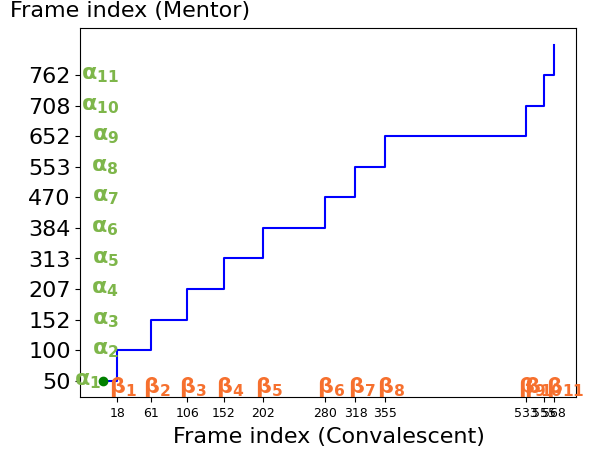

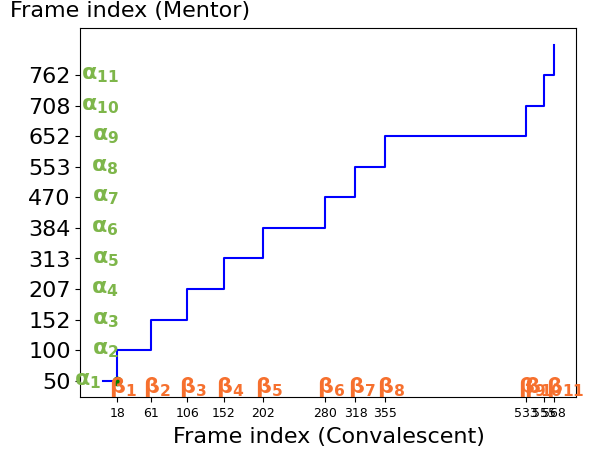

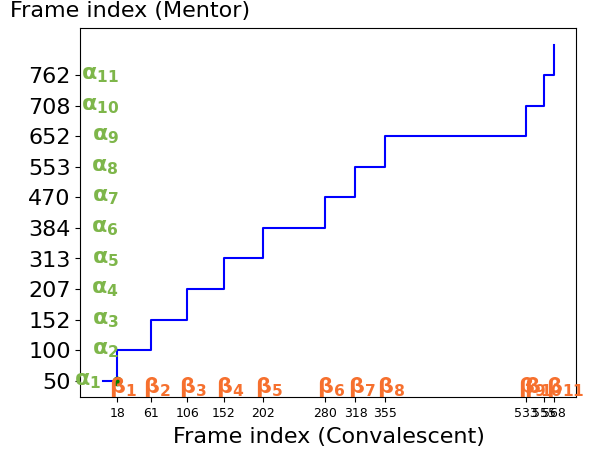

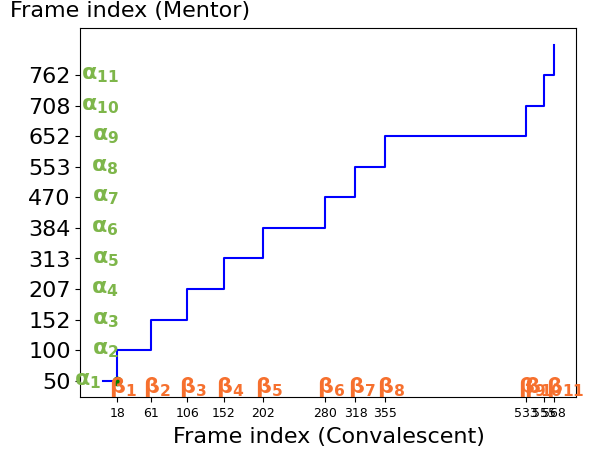

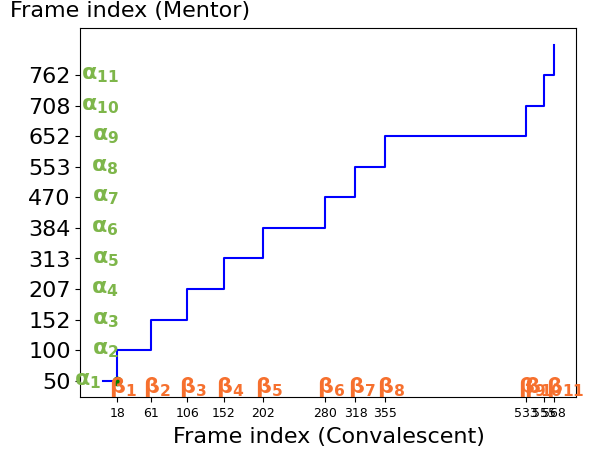

...

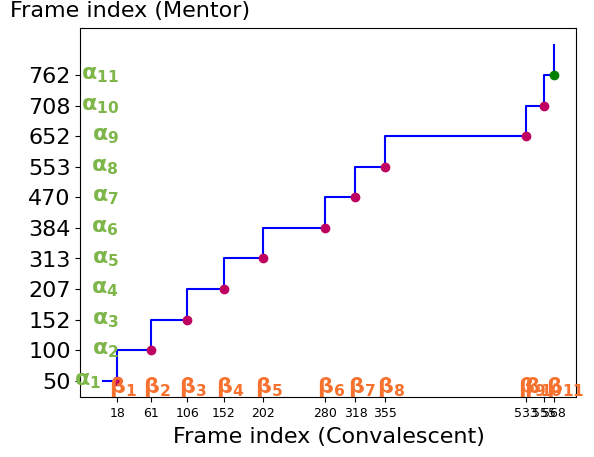

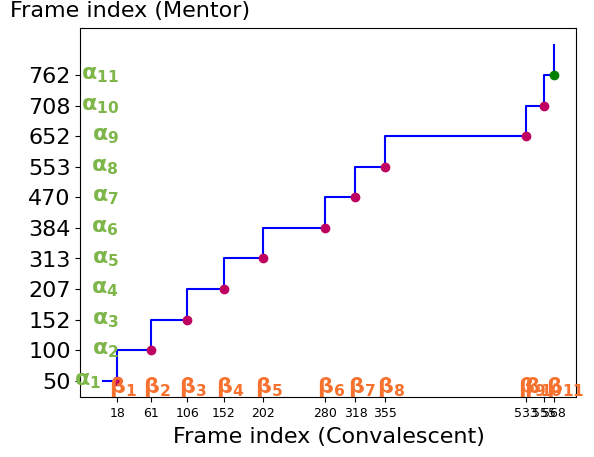

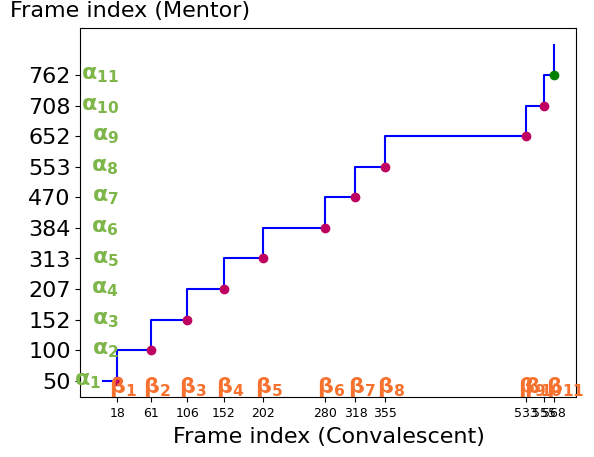

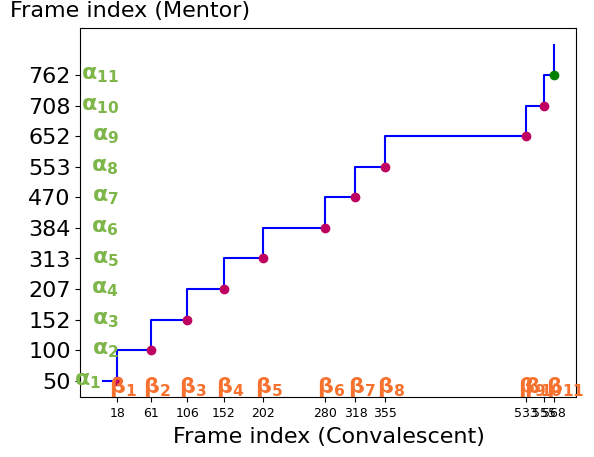

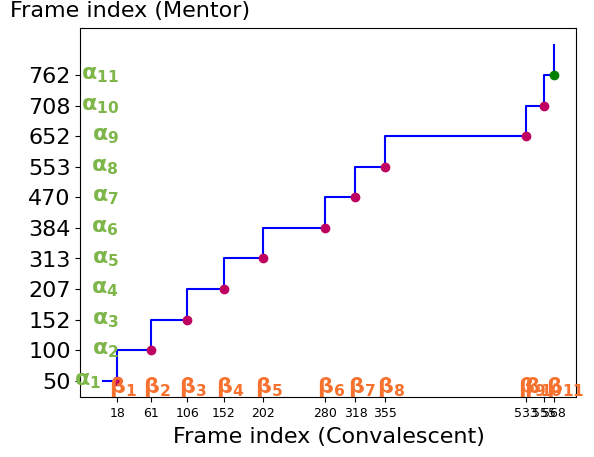

In [ ]:
# 階梯圖影像存檔設定
SAVE_IMAGES = True
OUTPUT_DIR = 'fig'
os.makedirs(OUTPUT_DIR, exist_ok=True)

#from cv import make_stats_vid
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # 編碼方式
# video_writer = cv2.VideoWriter(r"E:\college_recommand\DTW4\vid\test15.mp4", fourcc, 30, (2500, 1395))#930
video_writer = cv2.VideoWriter(r"output_video/anonymous_version.mp4", fourcc, 30, (2500, 1395))#930
#video_writer2 = cv2.VideoWriter(r"vid/demo_version.mp4", fourcc, 30, (2500, 1395))#930
# ppt_slide = cv2.imread(f"ppt/3.PNG")
# ppt_slide = cv2.resize(ppt_slide, (2500, 1395))
# for i in range(120):
#     video_writer2.write(ppt_slide)
###########################################################################################################
for vid_num in range(1):
    # ppt_slide = cv2.imread(f"ppt/{vid_num}.PNG")
    # ppt_slide = cv2.resize(ppt_slide, (2500, 1395))
    # ppt_slide2 = cv2.imread(f"ppt/{vid_num+4}.PNG")
    # ppt_slide2 = cv2.resize(ppt_slide2, (2500, 1395))
    # for howmanytimes in range(150):
    #     video_writer.write(ppt_slide)
    #     video_writer2.write(ppt_slide2)

    # patient1_result = vid_patient_HLTposition[vid_num] # 使用舊版本的結果
    #patient1_result = ptre[vid_num] # 使用新版本 DTW + 左邊, 全身, 右邊的結果
    print(ptre[vid_num])
    patient1_result = [ptre[vid_num][i] for i in range(11)] # 使用新版本 DTW + 左邊, 全身, 右邊的結果
    vid1_collect_similarity = vid_collect_similarity[vid_num]
    patientVideo1_vectors_AngleMatrix = patientVideo_vectors_AngleMatrix[vid_num]
    vid1_dtw_img_bgr = vid_dtw_img_bgr[vid_num]
    charactor2 = charactor[vid_num]
    # print("result:",result)
    # print("mentor_HightlightFrame:",mentor_HightlightFrame)
    # result = patient_HLTposition
    start = [0,0]
    frames_show_count = [0,0]
    mentor_HightlightFrame = list(map(int, mentor_HightlightFrame))
    similarity_history = []
    hlt_pic_history = np.ones((465, 2500, 3), dtype=np.uint8) * 255
    x_offset = 0
    for index in range(len(patient1_result)):
        if index > 11:
            continue
        vid1_dtw_img_bgr = make_dtw_result_img(patient1_result, index,False,mentor_HightlightFrame)
        similarity_history.append(vid1_collect_similarity[index])
        draw_tag = [False,False]
        print("index:",index)
        frames_show_count[0] = mentor_HightlightFrame[index] - start[0]
        frames_show_count[1] = patient1_result[index] - start[1]
        frames_show_count.sort()
        pic = 0
        for frames in range(frames_show_count[1]):
            #print("ssss",vid1_collect_similarity[start[1]])
            similarity_history[index] = vid1_collect_similarity[start[1]]
            img_action = make_action_similarity(index+1,similarity_history,mentor_HightlightFrame,patient1_result)
            img_action = cv2.resize(img_action, (500, 465))
            # cv2.imshow('img_action', img_action)
            # cv2.waitKey(0)
            #img2 = make_hit_frame(index,mentor_HightlightFrame,patient1_result)
            temp_move = 50
            temp = cv2.imread(f"ppt/AoL-based.jpg")
            temp = cv2.resize(temp,(int(temp.shape[1]*465/temp.shape[0]),int(temp.shape[0]*465/temp.shape[0])))
            temp_empty_img = np.ones((465, 500, 3), dtype=np.uint8)*255
            temp_empty_img[0:temp.shape[0],temp_move:temp.shape[1]+temp_move] = temp

            #img2 = cv2.resize(cv2.imread(f"ppt/AoL-based.jpg"), (500, 465))
            img2 = temp_empty_img
            # cv2.imshow('img2', img2)
            # cv2.waitKey(0)
            #print(img2.shape)
            img2 = cv2.resize(img2, (500, 465))
            img2 = np.vstack((img2, (np.ones((30, 500, 3), dtype=np.uint8) * 255)))
            img2[465:495, :, 0] = 255 ; img2[465:495, :, 1] = 0 ; img2[ 465:495,:, 2] = 0
            cv2.putText(img2,"ALPS  A (run-time value)",(105,485),cv2.FONT_HERSHEY_SIMPLEX,0.8,(255,255,255),2)
            cv2.putText(img2, "r", (182,485),cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2)
            cv2.putText(img2, "i", (205,480),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)
            img2 = cv2.resize(img2, (500, 465))
            #if_alldrawtag_img2.append(img2)
            #print(img2.shape)
            # cv2.imshow('img2', img2)
            # cv2.waitKey(0)
            extended_img = np.ones((465, 500, 3), dtype=np.uint8)*255
            if frames == frames_show_count[1]-1 or draw_tag[1]:
                vid1_dtw_img_bgr = make_dtw_result_img(patient1_result, index,True,mentor_HightlightFrame)
                img1 = make_stats_vid(list(mentorVideo_vectors_AngleMatrix[start[0]]),list(patientVideo1_vectors_AngleMatrix[start[1]]), vid1_collect_similarity[start[1]],1,jsonlen=11,nowindex=index)
            else:
                img1 = make_stats_vid(list(mentorVideo_vectors_AngleMatrix[start[0]]),list(patientVideo1_vectors_AngleMatrix[start[1]]), vid1_collect_similarity[start[1]],0,jsonlen=11,nowindex=index)
            img1 = cv2.resize(img1, (500, 465))

            combined_img = np.vstack((img2, img1))  #extended_img.copy()
            combined_img = add_line_to_outside(combined_img, (255, 0, 0),"ALPS Definition", 60)#Skeleton and Angles Representation
            #if_alldrawtag_img.append(combined_img)
            #cv2.imwrite('img1.png',combined_img)
            # print(combined_img.shape)
            img_to_draw = 0
            ##########################################################################
            img3 = getframe(f"alphapose_output/{charactor1}.mp4", start[0])
            x1, y1, x2, y2 = 0, 650, img3.shape[1], img3.shape[0]-150  # 替換為你的範圍
            img3 = img3[y1-120:y2, x1:x2]
            img3 = cv2.resize(img3, (1120, 1080))
            img_to_draw = img3.copy()
            print("start[0]:",start[0],"start[1]",start[1])
            cv2.putText(img3, f'Frame: {start[0]}', (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 2)
            cv2.putText(img3, 'Video Frozen', (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0,0,255), 2)
            cv2.putText(img3, f'Mentor', (900, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 2)
            if draw_tag[0] or frames == frames_show_count[1]-1:
                cv2.circle(img3, (350, 90), 15, (0, 255, 0), -1)
                #if_alldrawtag_img.append(img3)
            else:
                #畫白色空心圓
                #if_alldrawtag_img.append(cv2.circle(img3.copy(), (350, 90), 15, (0, 255, 0), -1))
                cv2.circle(img3, (350, 90), 15, (255, 255, 255), 2)
            ##########################################################################
            img4 = getframe(f"alphapose_output/{charactor2}.mp4", start[1])
            img4 = img4[150:y2-200, 0:img4.shape[1]-100]
            img4 = cv2.resize(img4, (1120, 1080))
            img_to_draw = np.vstack((img_to_draw, img4))
            cv2.putText(img4, f'Frame: {start[1]}', (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 2)
            cv2.putText(img4, 'Video Frozen', (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0,0,255), 2)
            cv2.putText(img4, f'convalescent', (700, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 2)
            if draw_tag[1] or frames == frames_show_count[1]-1:
                cv2.circle(img4, (350, 90), 15, (0, 255, 0), -1)
                #if_alldrawtag_img.append(img4)
            else:
                #if_alldrawtag_img.append(cv2.circle(img4.copy(), (350, 90), 15, (0, 255, 0), -1))
                cv2.circle(img4, (350, 90), 15, (255, 255, 255), 2)
            ##########################################################################
            # cv2.imshow('img3', img3)
            # cv2.imshow('img4', img4)
            # cv2.waitKey(0)

            #extended_img = np.ones((1080, 1080, 3), dtype=np.uint8) * 255
            combined_img2 = np.vstack((img3, img4))#,np.ones((1080,1120,  3), dtype=np.uint8) * 255
            img5 = getframe(f"motionbert_output/{charactor1}.mp4", start[0])
            img6 = getframe(f"motionbert_output/{charactor2}.mp4", start[1])
            x1, y1, x2, y2 = 170, 150, img5.shape[1]-100, img5.shape[0]-100  # 替換為你的範圍
            img5 = img5[y1:y2, x1:x2] ; img6 = img6[y1:y2, x1:x2]

            combined_img3 = np.vstack((img5, img6))#,np.ones((img5.shape[0],img5.shape[1],  3), dtype=np.uint8) * 255

            # cv2.imshow('img3', combined_img3)
            # cv2.waitKey(0)

            # 進行縮放
            resized_image = cv2.resize(combined_img2, (500, 930))
            resized_image = add_line_to_outside(resized_image, (255, 0, 0),"Video and 2D keypoint model (H)",150)

            # cv2.imshow('resized_image', resized_image)
            # cv2.waitKey(0)
            resized_image2 = cv2.resize(combined_img3, (500, 930))
            resized_image2 = add_line_to_outside(resized_image2, (0, 0, 255),"3D keypoint model (Q)",120)
            #if_alldrawtag_img.append(resized_image2)
            #(500,270)白色背景
            #extended_img = np.ones((135, 500, 3), dtype=np.uint8) * 255
            #resized_image = np.vstack((resized_image, extended_img))
            #resized_image2 = np.vstack((resized_image2, extended_img))
            dtw_png_final = make_dtw_png(vid1_dtw_img_bgr,img_action)
            dtw_png_final = add_line_to_outside(dtw_png_final, (0, 0, 255),"TALMA Results",40)
            final_img = np.hstack((resized_image, resized_image2,combined_img,dtw_png_final))
            final_img = cv2.resize(final_img,(2500,930))
            if frames == frames_show_count[1]-1:
            #if 1:
                if similarity_history[index] >= 0.7: # threshold
                    print("similarity_history[index]:",similarity_history[index])
                    cv2.putText(img_to_draw, f'{round(float(similarity_history[index]),3)}', (10, 1200), cv2.FONT_HERSHEY_SIMPLEX, 5, (34, 139, 34), 13)
                else:
                    print("similarity_history[index]:",similarity_history[index])
                    cv2.putText(img_to_draw, f'{round(float(similarity_history[index]),3)}', (10, 1200), cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 0, 255), 13)
                cv2.putText(img_to_draw, f'Frame {str(mentor_HightlightFrame[index])}', (600, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 13)
                cv2.putText(img_to_draw, f'Frame {str(patient1_result[index])}', (600, 1170), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 13)
                # cv2.imshow('img_to_draw', cv2.resize(img_to_draw, (200, 465)))
                # cv2.waitKey(0)
                img_to_draw = cv2.resize(img_to_draw, (200, 465))
                # 定義要貼上的位置 (y_start, y_end, x_start, x_end)
                y_start, y_end = 0, 0 + img_to_draw.shape[0]  # 100 到 350
                x_start, x_end = x_offset, x_offset + img_to_draw.shape[1]  # 200 到 300
                # 將小圖片貼到大圖片上
                hlt_pic_history[y_start:y_end, x_start:x_end] = img_to_draw
                x_offset += 230
                final_img = np.vstack((final_img, hlt_pic_history))

                # 儲存本步的階梯圖與最後畫面
                if SAVE_IMAGES:
                    base = f"{OUTPUT_DIR}/{charactor2}_step_{index+1}"
                    try:
                        cv2.imwrite(f"{base}_dtw.png", vid1_dtw_img_bgr) # 純階梯圖
                        cv2.imwrite(f"{base}_dtw_with_action.png", dtw_png_final) # 階梯圖＋動作表拼圖
                        cv2.imwrite(f"{base}_strip.png", hlt_pic_history) # 上方的階梯縮圖列
                        cv2.imwrite(f"{base}_final.png", final_img) # 最終大圖
                        print("Saved images for step", index+1)
                    except Exception as e:
                        print("Save images error:", e)
            else:
                final_img = np.vstack((final_img, hlt_pic_history))

            if start[0] < mentor_HightlightFrame[index]:
                start[0] += 1
            else:
                draw_tag[0] = True

            if start[1] < patient1_result[index]:
                start[1] += 1
            else:
                draw_tag[1] = True
            pic = final_img

            video_writer.write(pic)
            #video_writer2.write(pic)
            #cv2.imwrite(f"vid/{index}.png",pic)
            #sys.exit("程式結束")
            #input("ssss")
        for xxx in range(60):
            video_writer.write(pic)
            #video_writer2.write(pic)


video_writer.release()
#video_writer2.release()